# Notebook 6: Models interpretability

In [94]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [95]:
from utils import load_set, load_fitted_models, load_calibrated_models
from model_functions import evaluate_model_side_by_side
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import shap
from sklearn.inspection import permutation_importance, PartialDependenceDisplay, partial_dependence
from IPython.display import display
from sklearn.metrics import roc_auc_score, brier_score_loss
import pickle
from itertools import combinations


In [96]:
X_train, y_train = load_set(r'data\df_train_cleaned.csv', with_FS=True)
X_test, y_test = load_set(r'data\df_test_cleaned.csv', with_FS=True)
X_val, y_val = load_set(r'data\df_val_cleaned.csv', with_FS=True)

In [97]:
LR, XGB = load_fitted_models()
models = [LR, XGB]
names = ["Regresja Logistyczna", 'XGBoost']
CLR, CXGB = load_calibrated_models()
cal_models = [CLR, CXGB]
cal_names = ["Skalibrowana Regresja Logistyczna",  'Skalibrowany XGBoost']

## Opis schemat walidacji:
- podział danych na zbiory:
    - treingowy (60%),
    - kalibracyjny (10%),
    - testowy (20%),
    - walidacyjny (10%).


## Ewaluacja modeli i porównanie metryk

Model                               | Threshold  | F-beta (Train) 
-----------------------------------------------------------------
Skalibrowana Regresja Logistyczna   | 0.0640     | 0.3983
###############
Skalibrowana Regresja Logistyczna

=== Metryki Train vs Test ===


,precision_train,precision_test,recall_train,recall_test,f1-score_train,f1-score_test,support_train,support_test
0,0.910726,0.904110,0.904914,0.885057,0.907810,0.894482,1567.0,522.0
1,0.386831,0.325843,0.403433,0.371795,0.394958,0.347305,233.0,78.0



=== Metryki Globalne Probabilistyczne ===


,Train,Test
Metric,,
ROC AUC,0.7570,0.7453
PR AUC,0.3553,0.3714
KS Stat,0.3729,0.4039
Log Loss,0.4095,0.4640
Brier Score,0.1143,0.1145
Accuracy,0.8400,0.8183


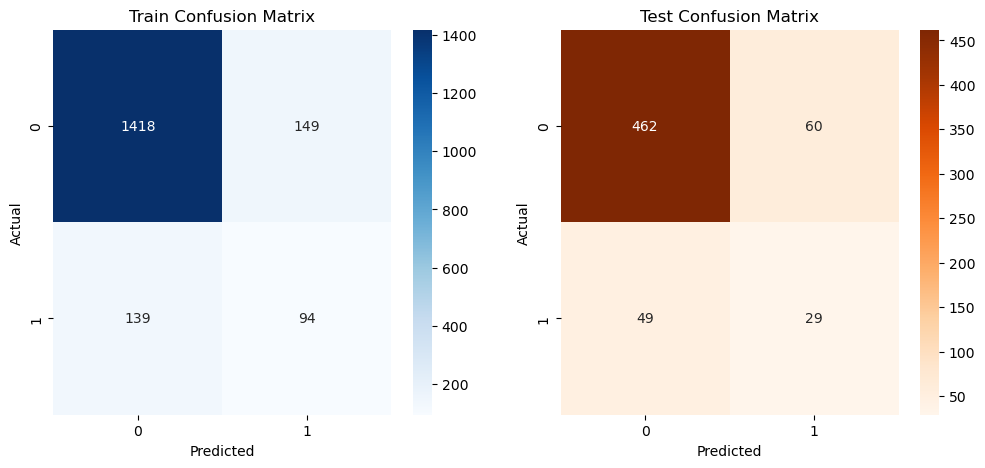

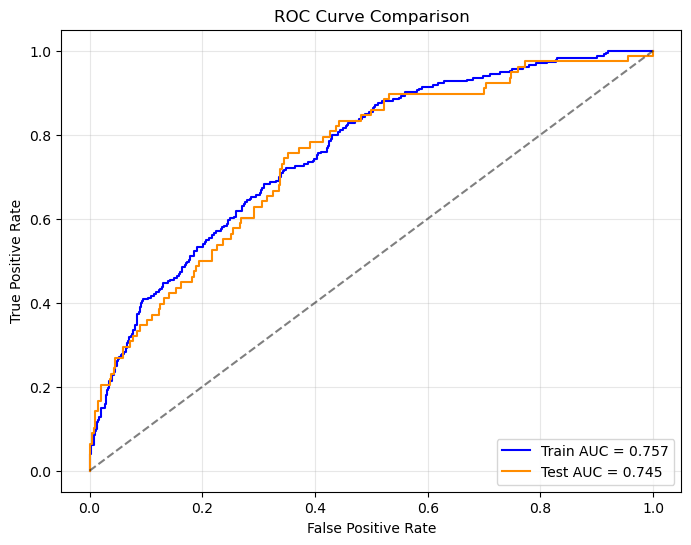

Model                               | Threshold  | F-beta (Train) 
-----------------------------------------------------------------
Skalibrowany XGBoost                | 0.0597     | 0.3894
###############
Skalibrowany XGBoost

=== Metryki Train vs Test ===


,precision_train,precision_test,recall_train,recall_test,f1-score_train,f1-score_test,support_train,support_test
0,0.921695,0.911447,0.818762,0.808429,0.867185,0.856853,1567.0,522.0
1,0.303922,0.270073,0.532189,0.474359,0.386895,0.344186,233.0,78.0



=== Metryki Globalne Probabilistyczne ===


,Train,Test
Metric,,
ROC AUC,0.7615,0.7606
PR AUC,0.3374,0.3403
KS Stat,0.3924,0.4182
Log Loss,0.4080,0.4078
Brier Score,0.1138,0.1144
Accuracy,0.7817,0.7650


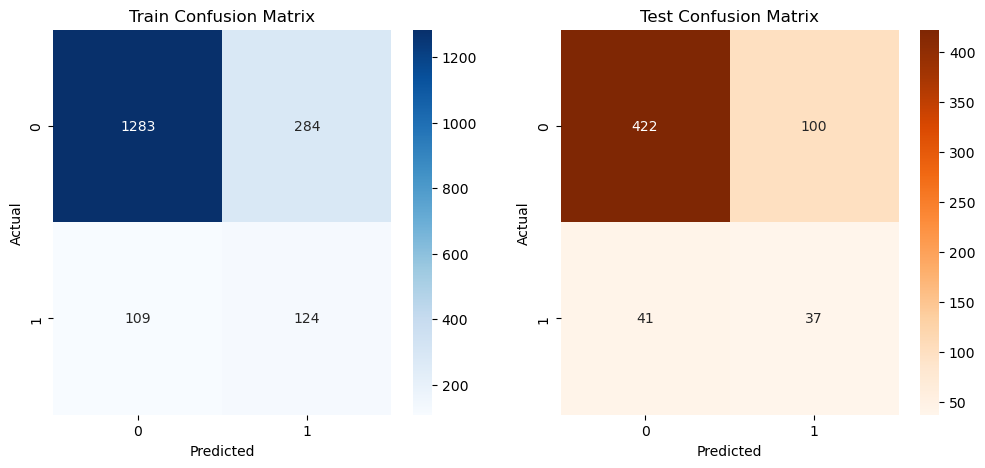

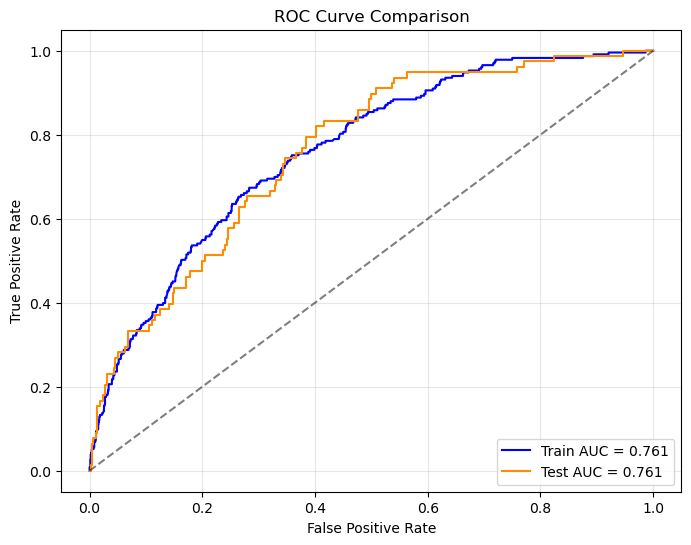

In [98]:
from sklearn.metrics import precision_recall_curve
import numpy as np

def get_best_threshold_fbeta_class1(y_true, y_proba, beta=0.5):
    """
    Znajduje próg maksymalizujący F-beta score DLA KLASY 1.
    
    Parametry:
    beta < 1 (np. 0.5): Priorytetem jest PRECYZJA (unikanie FP - fałszywych alarmów).
    beta > 1 (np. 2.0): Priorytetem jest RECALL (unikanie FN - przegapienia bankruta).
    """
    
    # 1. Jawnie wskazujemy, że interesuje nas klasa '1' (pos_label=1)
    precision, recall, thresholds = precision_recall_curve(y_true, y_proba, pos_label=1)
    
    # Usuwamy ostatni punkt (stan graniczny biblioteki sklearn: P=1, R=0), 
    # który nie ma odpowiadającego progu w tablicy thresholds
    precision = precision[:-1]
    recall = recall[:-1]
    
    # 2. Obliczenie F-beta (wzór harmoniczny ważony)
    numerator = (1 + beta**2) * (precision * recall)
    denominator = (beta**2 * precision) + recall
    
    with np.errstate(divide='ignore', invalid='ignore'):
        fbeta_scores = numerator / denominator
    
    # Zamiana NaN na 0
    fbeta_scores = np.nan_to_num(fbeta_scores)
    
    # 3. FILTROWANIE "PUSTYCH" WYNIKÓW
    # Jeśli Precision=0 lub Recall=0, to znaczy, że model nic nie znalazł (dla klasy 1).
    # Ustawiamy tam -1, żeby argmax tego nie wybrał.
    mask_useless = (recall == 0) | (precision == 0)
    fbeta_scores[mask_useless] = -1.0
    
    # 4. WYBÓR NAJLEPSZEGO PROGU
    if np.all(fbeta_scores == -1.0):
        # SYTUACJA AWARYJNA: Model przy zadanym Beta nie potrafi znaleźć
        # ani jednego punktu, w którym miałby sensowną Precyzję i Recall > 0.
        # Zazwyczaj dzieje się tak, gdy model jest słaby, a my żądamy bardzo wysokiej precyzji (beta=0.5).
        
        print(f"OSTRZEŻENIE: Dla beta={beta} nie znaleziono progu z Precision>0 i Recall>0.")
        print("Przełączam na strategię awaryjną: Maksymalizacja F1 (równowaga).")
        
        # Liczymy zwykłe F1 (beta=1)
        f1 = 2 * (precision * recall) / (precision + recall + 1e-10)
        ix = np.argmax(f1)
    else:
        # Standardowy wybór
        ix = np.argmax(fbeta_scores)
    
    best_thresh = thresholds[ix]
    best_score = fbeta_scores[ix] if fbeta_scores[ix] != -1 else 0.0
    
    return best_thresh, best_score

# --- PRZYKŁAD UŻYCIA W PĘTLI ---


new_thresholds = {}
short_names = ['CLR', 'CXGB']

target_beta = 1

for model, name, short_name in zip(cal_models, cal_names, short_names):
    # Pobieramy prawdopodobieństwa (klasa 1)
    y_train_proba = model.predict_proba(X_train)[:, 1]
    
    best_tr, best_sc = get_best_threshold_fbeta_class1(y_train, y_train_proba, beta=target_beta)
    new_thresholds[short_name] = best_tr
    
    print(f"{'Model':<35} | {'Threshold':<10} | {'F-beta (Train)':<15}")
    print("-" * 65)
    print(f"{name:<35} | {best_tr:.4f}     | {best_sc:.4f}")
    evaluate_model_side_by_side(model, name, X_train, y_train, X_test, y_test, threshold=best_tr, vis=True)


with open(r'models/thresholds.pkl', 'wb') as f:
    pickle.dump(new_thresholds, f)

In [99]:
print(new_thresholds)

{'CLR': 0.06397366295853038, 'CXGB': 0.05971362441778183}


## Korelacje cech:
- mogą potencjalnie wpływać na wartości SHAP -> porównujemy regresję i model drzewiasty, które różnie radzą sobie ze skorelowanymi cechami.

In [100]:
corr_matrix = X_train.corr()

correlated_pairs = []
cols = corr_matrix.columns

for i in range(len(cols)):
    for j in range(i + 1, len(cols)):
        val = corr_matrix.iloc[i, j]
        if abs(val) > 0.6:
            correlated_pairs.append({
                "Cecha 1": cols[i],
                "Cecha 2": cols[j],
                "Korelacja": val,
                "Siła (|r|)": abs(val) # Kolumna pomocnicza do sortowania
            })

df_corr = pd.DataFrame(correlated_pairs)

if not df_corr.empty:
    df_corr = df_corr.sort_values("Siła (|r|)", ascending=False).reset_index(drop=True)
    print(f"\n=== SILNE KORELACJE (|r| > 0.6) - Znaleziono par: {len(df_corr)} ===")
    styled_df = (df_corr.drop(columns=["Siła (|r|)"])
                 .style
                 .background_gradient(cmap="coolwarm", vmin=-1, vmax=1)
                 .format({"Korelacja": "{:.3f}"}))
    display(styled_df)
else:
    print("\nBrak silnych korelacji (|r| > 0.6).")


=== SILNE KORELACJE (|r| > 0.6) - Znaleziono par: 28 ===


,Cecha 1,Cecha 2,Korelacja
0,numeric_pipeline__-log_wsk_ebitda_koszty_odsetkowe_3,numeric_pipeline__-log_wsk_pokrycia_odsetek_zyskiem,0.695
1,numeric_pipeline__-wsk_ebitda_zobowiazan_odsetki_3_sqrt,numeric_pipeline__-log_wsk_ebitda_zobowiazan_odsetki_3,0.694
2,numeric_pipeline__-Naleznosci_dostaw_uslug_12m_pozostale,numeric_pipeline__-Zobowiazania_dostaw_uslug_12m_pozostale,0.693
3,numeric_pipeline__-log_wsk_obrotowosc_gotowkowa,numeric_pipeline__-log_wsk_marza_ebit,0.688
4,numeric_pipeline__-podatek_dochodowy_sqrt,numeric_pipeline__-log_podatek_dochodowy,0.685
5,numeric_pipeline__-log_wsk_ebitda_3,numeric_pipeline__-log_wsk_ebit,0.683
6,numeric_pipeline__wsk_zadluzenia_gotowki_1,numeric_pipeline__wsk_zadluzenia_gotowki_1_sqrt,-0.672
7,numeric_pipeline__-log_wsk_struktury_kapitalu,numeric_pipeline__wsk_struktury_kapitalu_squared,-0.672
8,numeric_pipeline__-log_wsk_ebitda_koszty_odsetkowe_3,numeric_pipeline__-log_wsk_ebitda_koszty_finansowe_2,0.671
9,numeric_pipeline__-log_wsk_ebitda_zobowiazan_odsetki_3,numeric_pipeline__-log_wsk_ebitda_koszty_odsetkowe_3,0.670


Wśród naszych cech nie mamy bardzo silnych korelacji, jednak są pary o umiarkowanie silnej korelacji (ok. 0.6 - 0.7 w module).

## Variance Inflation Factor

In [101]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

def calculate_vif(X):
    
    vif_data = pd.DataFrame()
    vif_data["Feature"] = X.columns
    vif_data["VIF"] = [variance_inflation_factor(X.values, i) 
                       for i in range(len(X.columns))]
    
    return vif_data.sort_values(by="VIF", ascending=False)

calculate_vif(X_train)

,Feature,VIF
27,numeric_pipeline__-log_Inwestycje_krotkoterminowe,11.481833
66,numeric_pipeline__wsk_efekt_dzwigni_fin_1_sqrt,11.328063
49,numeric_pipeline__-wsk_ebitda_3_sqrt,9.643134
19,numeric_pipeline__-log_Aktywa,9.492312
48,numeric_pipeline__-log_wsk_marza_ebit,9.474317
...,...,...
47,numeric_pipeline__-wsk_zysk_ebitda_1,1.146534
24,numeric_pipeline__wsk_ogolnego_zadluzenia_2,1.130193
53,numeric_pipeline__wsk_marza_brutto_1,1.127672
69,symbols_pipeline__formaWlasnosci_Symbol,1.113307


Są pojedyncze cechy z dużą wartością VIF, co może sugerować, że potencjalną redundantność (cechy nie koniecznie wniosą nowe informacje do modelu przy obecności pozostałych).

## Obliczenie wartości SHAP dla modeli

In [102]:
def get_shap_for_class(shap_values, class_idx=1):
    # Wyciąga wartości SHAP dla wybranej klasy w klasyfikacji binarnej.
    print(f"\nKształt obiektu SHAP: {shap_values.shape}")
    print(f"Kształt macierzy values: {shap_values.values.shape}")
    print(f"Kształt base_values: {shap_values.base_values.shape}")
    
    # Dla klasyfikacji binarnej:
    # - Jeśli shape jest (n, features, 2), bierzemy [:, :, 1] dla klasy pozytywnej
    # - Jeśli shape jest (n, features), już mamy właściwe wartości
    
    if len(shap_values.values.shape) == 3:
        # Klasyfikacja binarna z wartościami dla obu klas
        values = shap_values.values[:, :, class_idx]
        baseline = float(shap_values.base_values[0, class_idx])
    else:
        # Już przekonwertowane na jedną klasę
        values = shap_values.values
        baseline = float(shap_values.base_values[0])
        
    print(f"\nBaseline (wartość bazowa): {baseline:.4f}")
    
    return values, baseline


In [103]:
# LR
explainer_LR = shap.LinearExplainer(LR, X_train, feature_names=X_train.columns)
shap_values_LR = explainer_LR(X_test)
shap_vals_LR, baseline_LR = get_shap_for_class(shap_values_LR, class_idx=1)
# calibrated LR
explainer_CLR = shap.Explainer(CLR.predict_proba, X_train, feature_names=X_train.columns)
shap_values_CLR = explainer_CLR(X_test)
shap_vals_CLR, baseline_CLR = get_shap_for_class(shap_values_CLR, class_idx=1)

# XGB
explainer_XGB = shap.TreeExplainer(XGB, X_train, feature_names=X_train.columns)
shap_values_XGB = explainer_XGB(X_test)
shap_vals_XGB, baseline_XGB = get_shap_for_class(shap_values_XGB, class_idx=1)
# calibrated XGB
explainer_CXGB = shap.Explainer(CXGB.predict_proba, X_train, feature_names=X_train.columns)
shap_values_CXGB = explainer_CXGB(X_test)
shap_vals_CXGB, baseline_CXGB = get_shap_for_class(shap_values_CXGB, class_idx=1)


Kształt obiektu SHAP: (600, 93)
Kształt macierzy values: (600, 93)
Kształt base_values: (600,)

Baseline (wartość bazowa): -0.1672


PermutationExplainer explainer: 601it [00:17, 14.54it/s]                         



Kształt obiektu SHAP: (600, 93, 2)
Kształt macierzy values: (600, 93, 2)
Kształt base_values: (600, 2)

Baseline (wartość bazowa): 0.0358

Kształt obiektu SHAP: (600, 93)
Kształt macierzy values: (600, 93)
Kształt base_values: (600,)

Baseline (wartość bazowa): -0.0458


PermutationExplainer explainer: 601it [00:23, 14.37it/s]                         


Kształt obiektu SHAP: (600, 93, 2)
Kształt macierzy values: (600, 93, 2)
Kształt base_values: (600, 2)

Baseline (wartość bazowa): 0.0368


## Przydatne funkcje

In [104]:
# Współczynniki LR
def print_coef_table(model, X):
    # 1. Pobieranie współczynników (obsługa surowego modelu i Pipeline)
    if hasattr(model, 'coef_'):
        betas = model.coef_.ravel()
    elif hasattr(model, 'named_steps') and 'classifier' in model.named_steps:
        # Jeśli podasz Pipeline, próbujemy wyciągnąć z kroku 'classifier'
        betas = model.named_steps['classifier'].coef_.ravel()
    else:
        print("Błąd: Nie znaleziono współczynników (.coef_) w podanym modelu.")
        return

    # 2. Weryfikacja zgodności wymiarów
    if len(X.columns) != len(betas):
        print(f"BŁĄD WYMIARÓW: Model ma {len(betas)} współczynników, a X ma {len(X.columns)} kolumn.")
        print("Upewnij się, że podajesz X po transformacjach (np. OHE), a nie surowe dane.")
        return

    # 3. Budowa tabeli
    df = pd.DataFrame({
        "Zmienna": X.columns,
        "β": betas
    })

    # 4. Wyliczenie metryk: Odds Ratio (OR) i moduł z Bety
    df["OR"] = np.exp(df["β"])
    df["|β|"] = df["β"].abs()

    # 5. Sortowanie malejąco po sile wpływu (|β|)
    df_sorted = df.sort_values("|β|", ascending=False).reset_index(drop=True)

    # 6. Wyświetlanie
    print(f"=== Ranking zmiennych wg siły wpływu (|β|) ===")
    
    # 7. Formatowanie dla czytelności
    styled_df = df_sorted.style.format({
        "β": "{:.4f}",
        "OR": "{:.4f}",
        "|β|": "{:.4f}"
    }).background_gradient(subset=["|β|"], cmap="Reds")
    
    display(styled_df)
    
    return df_sorted


# Średnia |SHAP| - globalna ważność
def plot_mean_shap(shap_values, X, top_n=None):
    shap_importance = pd.DataFrame({
        'feature': X.columns,
        'importance': np.abs(shap_values).mean(axis=0)
    }).sort_values('importance', ascending=True)

    if top_n is not None:
        shap_importance2 = shap_importance.tail(top_n)

    fig, ax = plt.subplots(figsize=(10, 6))
    ax.barh(shap_importance2['feature'], shap_importance2['importance'], color='coral')
    ax.set_xlabel('Mean |SHAP value|')
    ax.set_title('SHAP Feature Importance\n(globalna, z możliwością kierunku)')
    ax.grid(axis='x', alpha=0.3)
    plt.tight_layout()
    plt.show()
    return shap_importance


# Standardowa Feature Importance z Random Forest
def plot_tree_model_feature_importances(model, X, top_n=None):
    tree_importance = pd.DataFrame({
        'feature': X.columns,
        'importance': model.feature_importances_
    }).sort_values('importance', ascending=True)

    if top_n is not None:
        tree_importance2 = tree_importance.tail(top_n)
    
    fig, ax = plt.subplots(figsize=(10, 6))
    ax.barh(tree_importance2['feature'], tree_importance2['importance'])
    ax.set_xlabel('Feature Importance (Gini)')
    ax.set_title('Random Forest Feature Importance\n(globalna, bez kierunku)')
    ax.grid(axis='x', alpha=0.3)
    plt.tight_layout()
    plt.show()
    return tree_importance


# Permutation Importance
def plot_permutation_importance(model, X, y, top_n=10, rng_seed=42):

    r = permutation_importance(
        model, X, y,
        n_repeats=10,
        random_state=rng_seed,
        scoring="roc_auc"
    )

    perm_importance = pd.DataFrame({
        'feature': X.columns,
        'importance': r.importances_mean
    }).sort_values('importance', ascending=True)

    perm_importance2 = perm_importance.tail(top_n)

    fig, ax = plt.subplots(figsize=(10, 6))
    ax.barh(perm_importance2['feature'], perm_importance2['importance'], color='lightgreen')
    ax.set_xlabel('Mean Importance Decrease (ROC AUC)')
    ax.set_title('Permutation Feature Importance\n(o ile spadnie wynik, gdy pomieszamy cechę)')
    ax.grid(axis='x', alpha=0.3)
    plt.tight_layout()
    plt.show()
    return perm_importance


# Scatter plots dla 6 najważniejszych cech
import matplotlib.pyplot as plt
import numpy as np

def plot_scatter_for_top_features(shap_values, top_features, X_test):
    
    fig, axes = plt.subplots(3, 2, figsize=(18, 15))
    axes_flat = axes.flatten()
    
    features_to_plot = top_features[:6]
    
    for i, feature in enumerate(features_to_plot):
        ax = axes_flat[i]
        
        feature_shap_values = shap_values.values[:, X_test.columns.get_loc(feature)]
        
        scatter = ax.scatter(
            X_test[feature], 
            feature_shap_values,
            alpha=0.5,
            c=feature_shap_values,
            cmap='RdBu_r'
        )
        
        ax.axhline(0, color='gray', linestyle='--', linewidth=1)
        ax.set_xlabel(f'Wartość cechy: {feature}', fontsize=10)
        ax.set_ylabel('SHAP value', fontsize=10)
        ax.set_title(f'{i+1}. Wpływ cechy: {feature}', fontsize=12, fontweight='bold')
        ax.grid(alpha=0.3)
    
    # Jeśli cech jest mniej niż 6, usuwamy puste wykresy z siatki
    for j in range(len(features_to_plot), len(axes_flat)):
        fig.delaxes(axes_flat[j])
    
    plt.tight_layout()
    plt.show()
    

def find_max_and_min_risk_obs(shap_vals, y_pred_proba, X_test):
    idx_max = np.argmax(y_pred_proba)
    patient_max = X_test.iloc[idx_max]
    patient_proba = y_pred_proba[idx_max]
    #patient_shap = shap_vals[idx_max]
    print(f"PD klienta o najwyższym ryzyku defaultu: {patient_proba:.3f}\n")

    idx_min = np.argmin(y_pred_proba)
    patient_min = X_test.iloc[idx_min]
    patient_proba_min = y_pred_proba[idx_min]
    print(f"PD klienta o najniższym ryzyku defaultu: {patient_proba_min:.3f}\n")
    
    return idx_max, idx_min



# Model interpretowalny (Regresja Logistyczna)

Skupimy się na interpretacji modeli przed kalibracją, gdyż kalibracja, jako przekształcenie monotoniczne, nie wpływa na ranking ważności cech. Wyjaśnianie modelu skalibrowanego (wrappera) jest często technicznie trudne, wolne i mniej intuicyjne, gdyż nie możemy zastosować na nim Linear/Tree Explainera.

## Globalne wyjaśnienia

### 1. Znaki i wielkość współczynników

In [105]:
df_coef = print_coef_table(LR, X_test)

=== Ranking zmiennych wg siły wpływu (|β|) ===


,Zmienna,β,OR,|β|
0,numeric_pipeline__log_wsk_zadluzenia,0.0771,1.0801,0.0771
1,numeric_pipeline__-log_Kapital_zapasowy,0.0562,1.0578,0.0562
2,numeric_pipeline__wsk_ogolnego_zadluzenia_pozyczki_squared,0.0439,1.0448,0.0439
3,numeric_pipeline__log_wsk_koszty_przychody,0.0429,1.0438,0.0429
4,numeric_pipeline__-log_wsk_pokrycia_odsetek_zyskiem,0.0413,1.0422,0.0413
5,numeric_pipeline__wsk_zadluzenia_pozyczki_dlugie_sqrt,0.0395,1.0403,0.0395
6,numeric_pipeline__log_wsk_efekt_dzwigni_fin_1,0.0389,1.0396,0.0389
7,numeric_pipeline__-log_pozostale_przychody_oper,0.0372,1.0379,0.0372
8,numeric_pipeline__-log_Naleznosci_dostaw_uslug_12m_powiazane,0.0370,1.0377,0.0370
9,numeric_pipeline__-log_wsk_ebitda_koszty_odsetkowe_3,0.0351,1.0358,0.0351


### 2. Ważność cech

### Skalibrowana Regresja Logistyczna

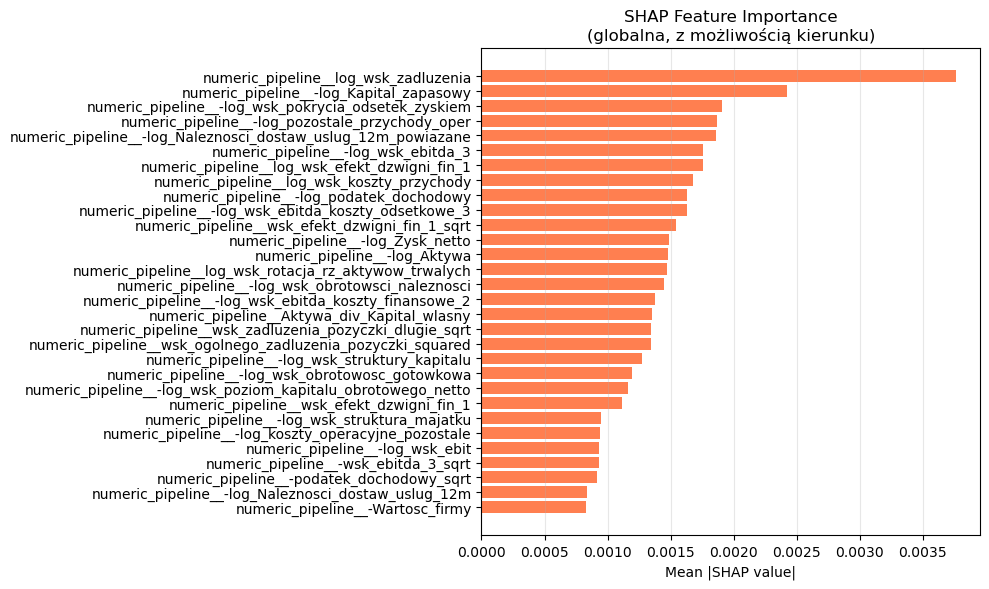

In [106]:
mean_shap_CLR = plot_mean_shap(shap_vals_CLR, X_test, 30)

### Regresja Logistyczna

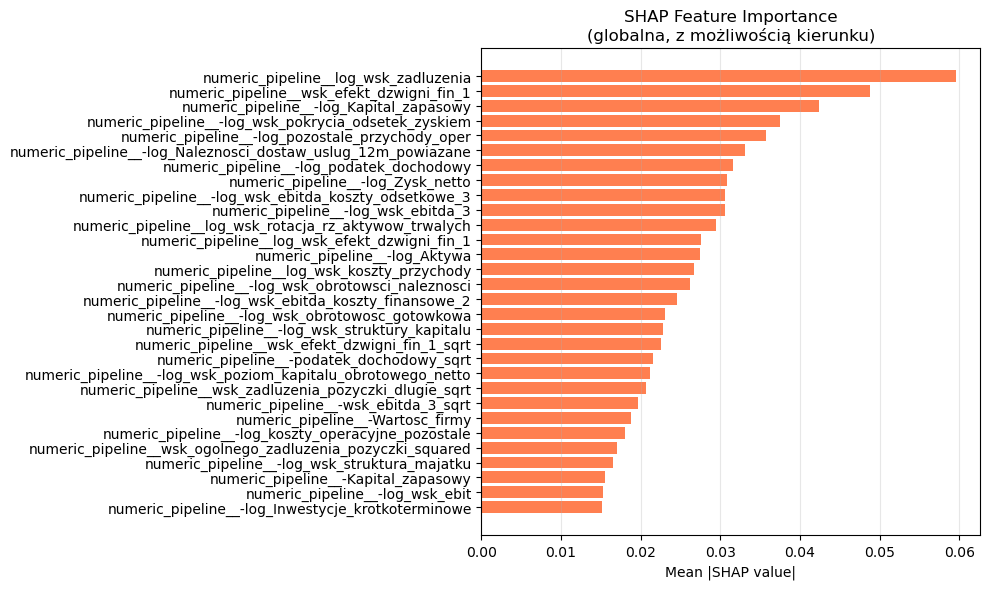

In [107]:
# Średnie |SHAP|
mean_shap_LR = plot_mean_shap(shap_vals_LR, X_test, 30)

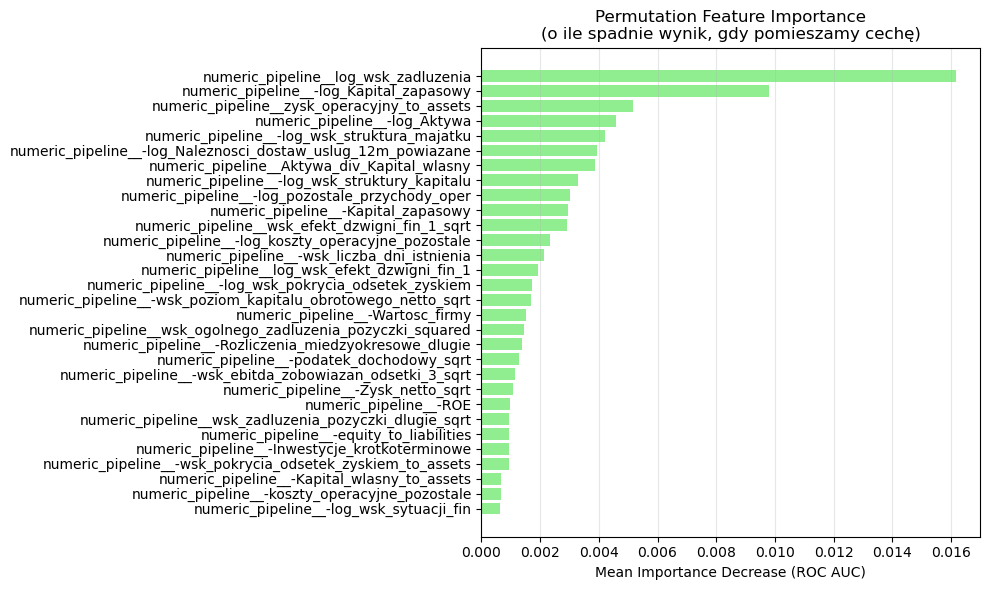

In [108]:
# Premutation Importance
perm_imp_LR = plot_permutation_importance(LR, X_test, y_test, top_n=30)

#### Obserwacja:
Widać, że wnioski o najbardziej istotnych cechach na bazie SHAP i Permutation Importance są w dużej mierze zgodne.

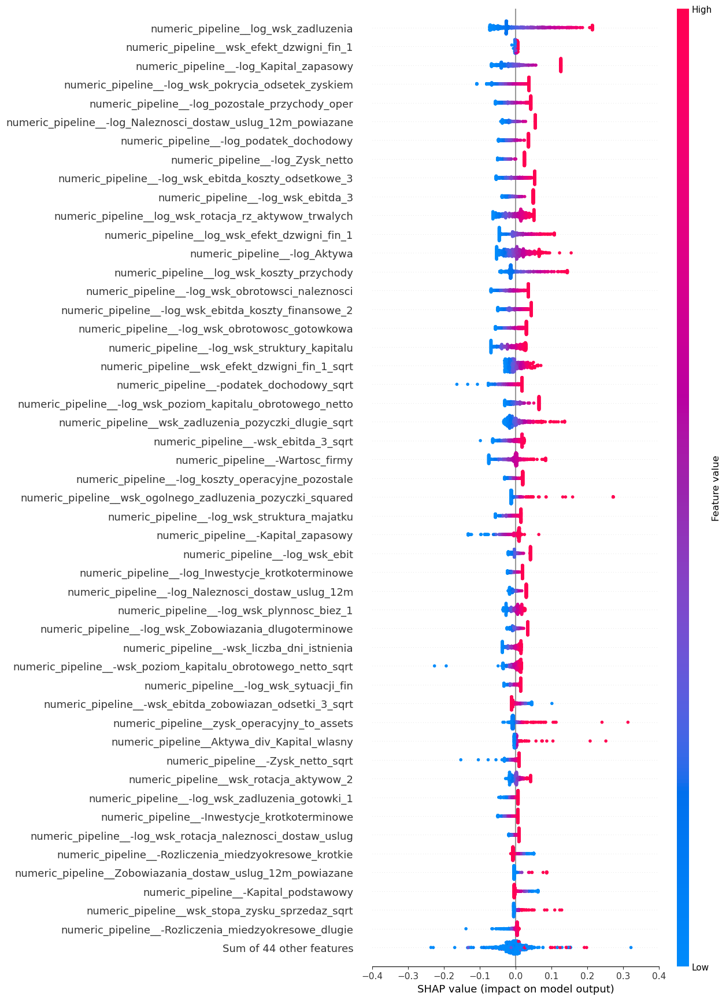

In [109]:
# Beeswarm plot - podsumowanie dla wszystkich obserwacji (klasa default=1)
shap.plots.beeswarm(shap_values_LR, max_display=50, show=False)
plt.xlim(-0.4, .4)
plt.show()

#### Obserwacja:
Na powyższym wykresie widać duży rozrzut wartości SHAP dla kilku cech (chociażby logarytmu wskaźnika zadłużenia). Może to oznaczać ich wysoki wpływ na predykcje, gdyż cechy te mogą zarówno zwiększać lub zmniejszać prawdopodobieństwo defaultu.

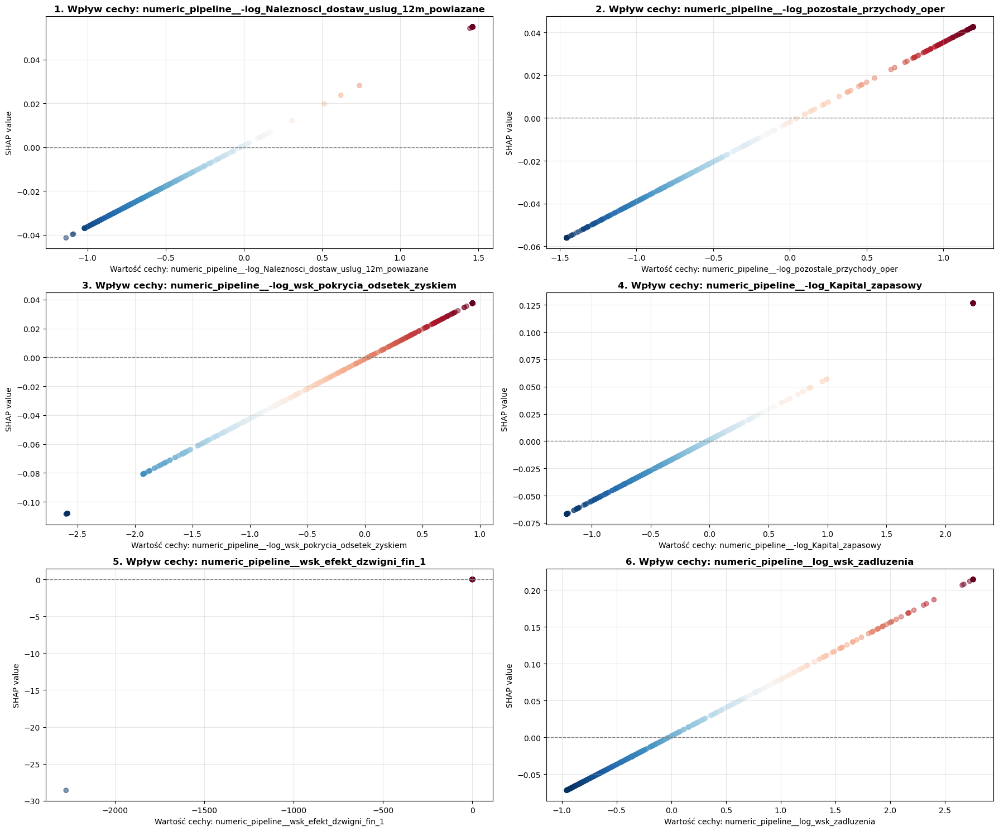

In [110]:
top_6_features = mean_shap_LR.tail(6)['feature'].values
plot_scatter_for_top_features(shap_values_LR, top_6_features, X_test)

### 3. Partial Dependence Plots

In [111]:
def pdp_plot_for_top_features(model, X_train, features_list, name="Model"):
    fig, ax = plt.subplots(figsize=(30, 12))
    display = PartialDependenceDisplay.from_estimator(
        model,
        X_train,
        features_list,
        kind='average',
        ax=ax
    )
    
    plt.suptitle(f'Partial Dependence Plots - {name}', 
                 fontsize=16, fontweight='bold', y=1.02)
    plt.tight_layout()
    plt.show()

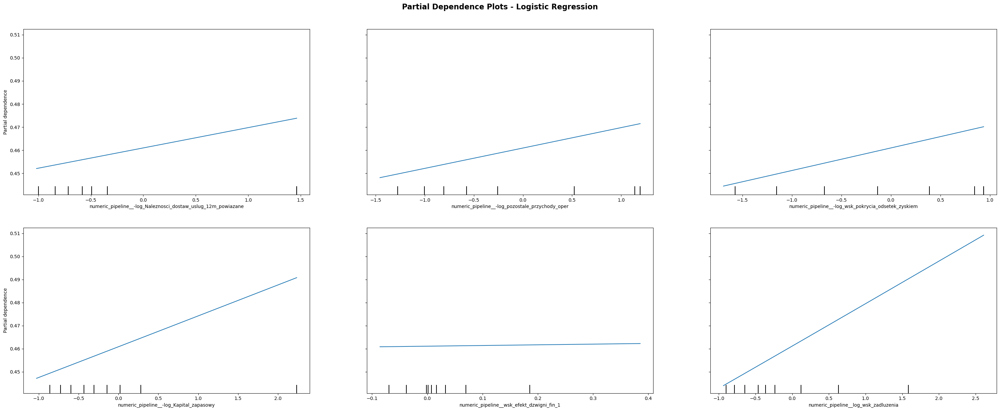

In [112]:
pdp_plot_for_top_features(LR, X_train, mean_shap_LR.tail(6)['feature'].values, "Logistic Regression")

#### Obserwacja:
Widzimy charakterystyczne linie PDP dla modelu regresji, różnią się tylko nachyleniem. 

### 4. Krzywe ICE

In [113]:
def centered_ice_plot(model, X_train, features_list, name="Model"):
    fig, ax = plt.subplots(figsize=(30, 12))
    display = PartialDependenceDisplay.from_estimator(
    model,
    X_train,
    features_list,
    kind='both',  # ICE + PDP
    centered=True,  # Wycentrowany
    ax=ax
    )
    plt.suptitle(f'Centered ICE Plots - {name}', 
                     fontsize=16, fontweight='bold', y=1.02)
    
    plt.tight_layout()
    plt.show()

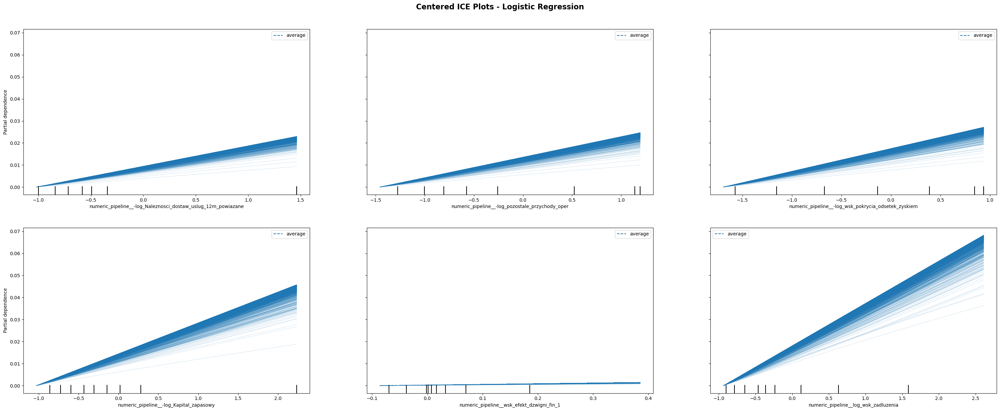

In [114]:
centered_ice_plot(LR, X_train, mean_shap_LR.tail(6)['feature'].values, "Logistic Regression")

#### Obserwacja:
Wszystkie linie ICE są równoległe co sugeruje brak interakcji. Model zakłada addytywnośc efektów.

### 5. Interakcje

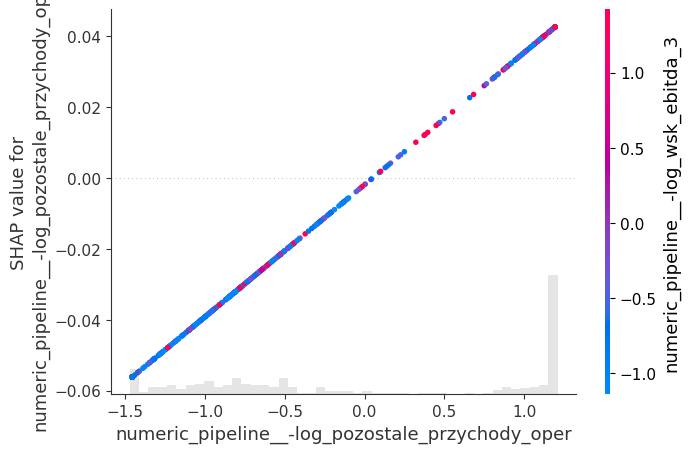

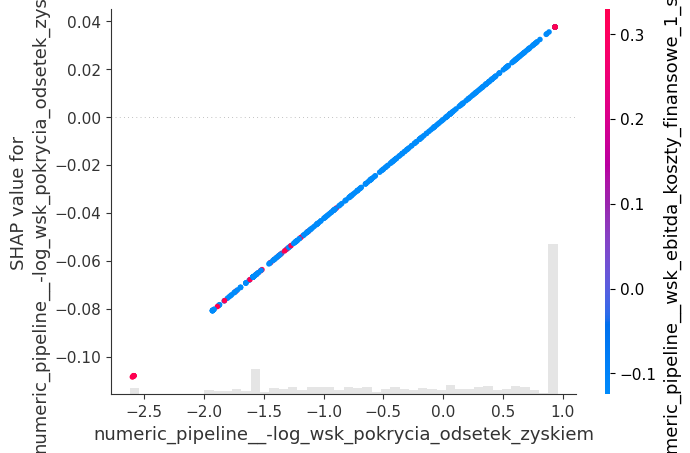

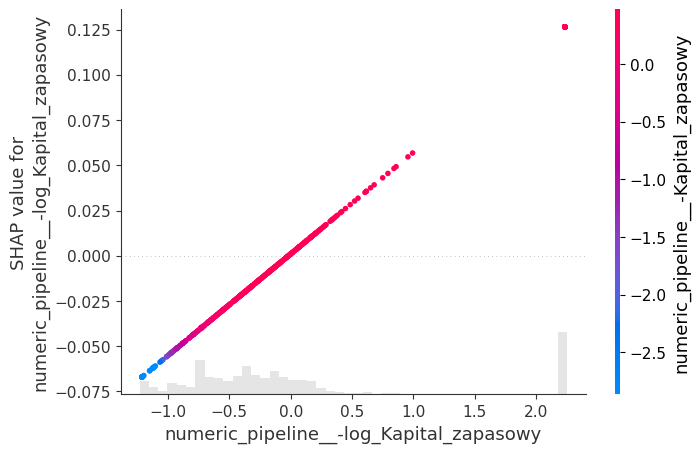

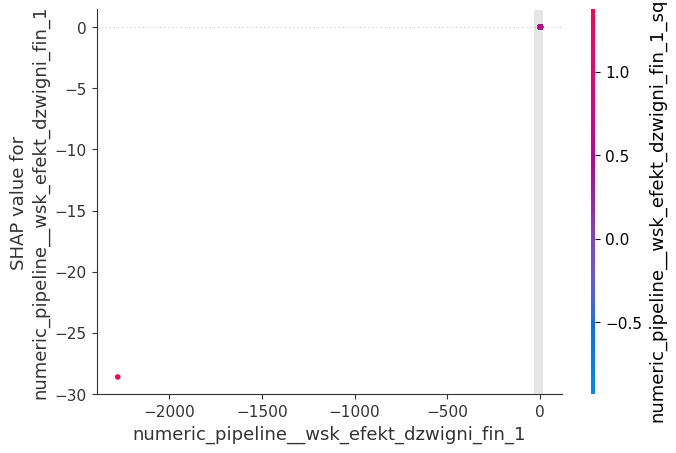

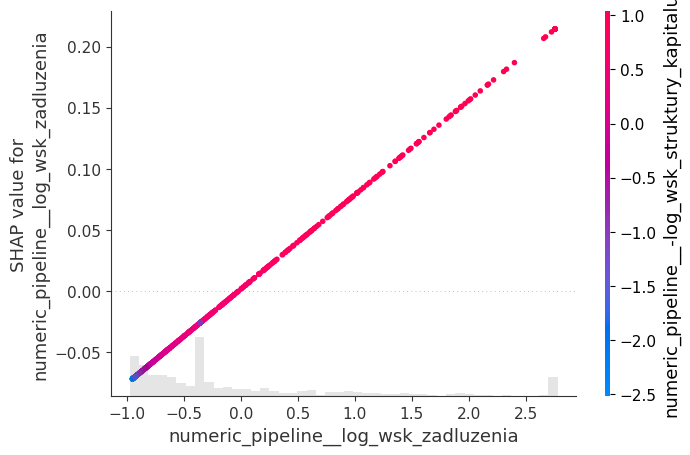

In [115]:
top_5_features_LR = mean_shap_LR.tail(5)['feature'].values
for feat in top_5_features_LR:
    shap.plots.scatter(shap_values_LR[:, feat], color=shap_values_LR)

In [116]:
def plot_2d_pdp(model, X_train, features):
    fig, ax = plt.subplots(figsize=(10, 8))
    
    display = PartialDependenceDisplay.from_estimator(
        model,
        X_train,
        features,  # tuple dla 2D
        kind='average',
        ax=ax
    )
    
    plt.title(f'2D PDP: Interakcja {features}', 
              fontsize=14, fontweight='bold')
    plt.tight_layout()
    plt.show()

In [117]:
mean_shap_LR.tail(5)['feature'].values

array(['numeric_pipeline__-log_pozostale_przychody_oper',
       'numeric_pipeline__-log_wsk_pokrycia_odsetek_zyskiem',
       'numeric_pipeline__-log_Kapital_zapasowy',
       'numeric_pipeline__wsk_efekt_dzwigni_fin_1',
       'numeric_pipeline__log_wsk_zadluzenia'], dtype=object)

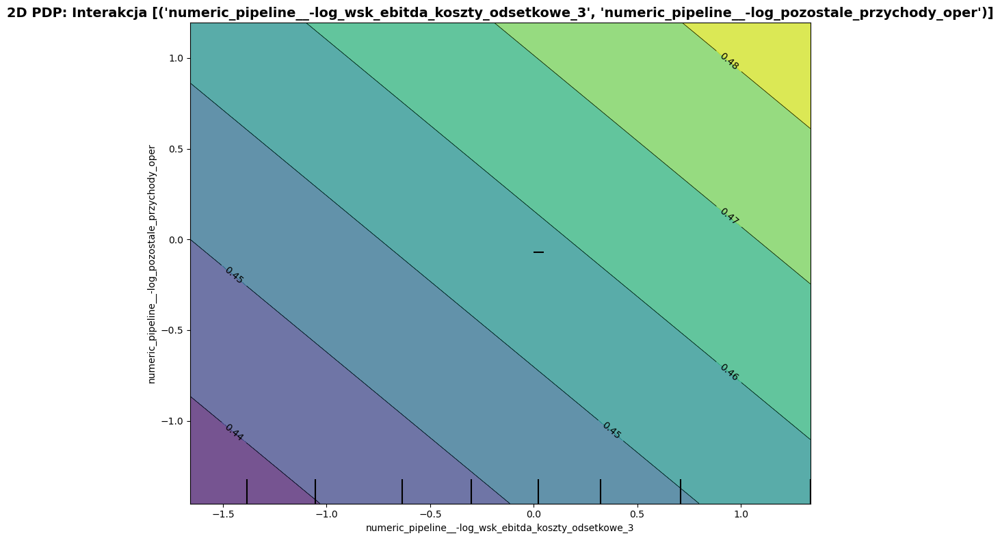

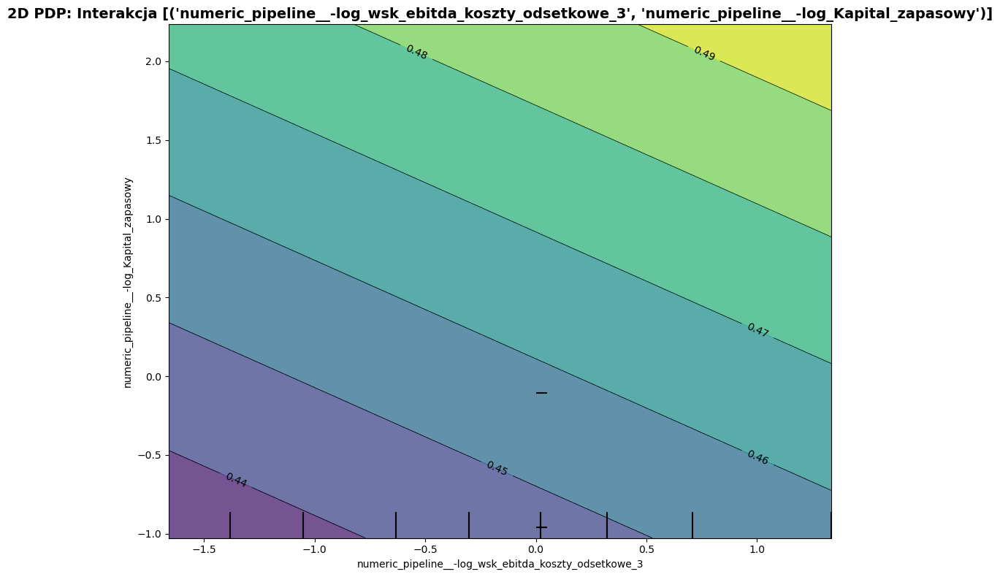

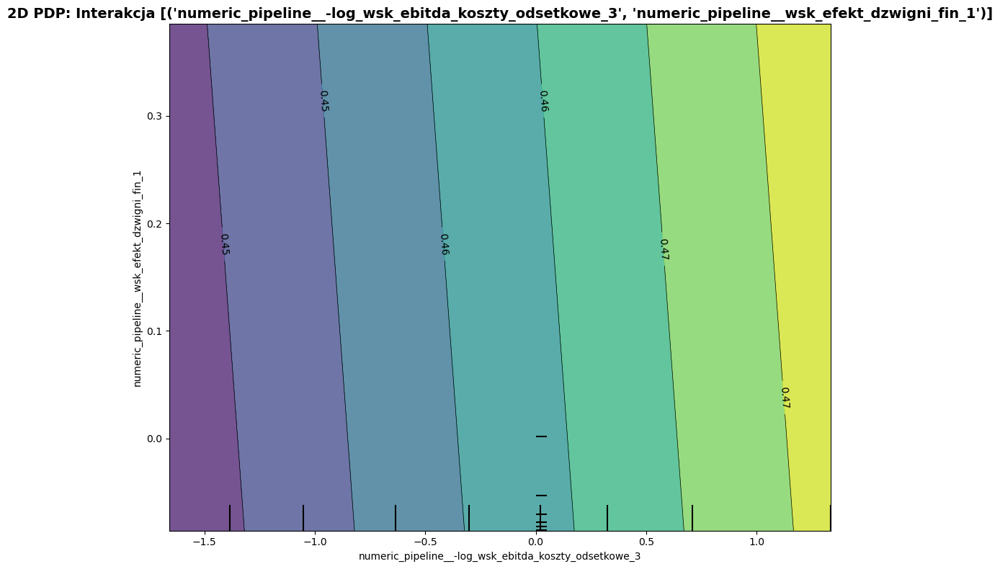

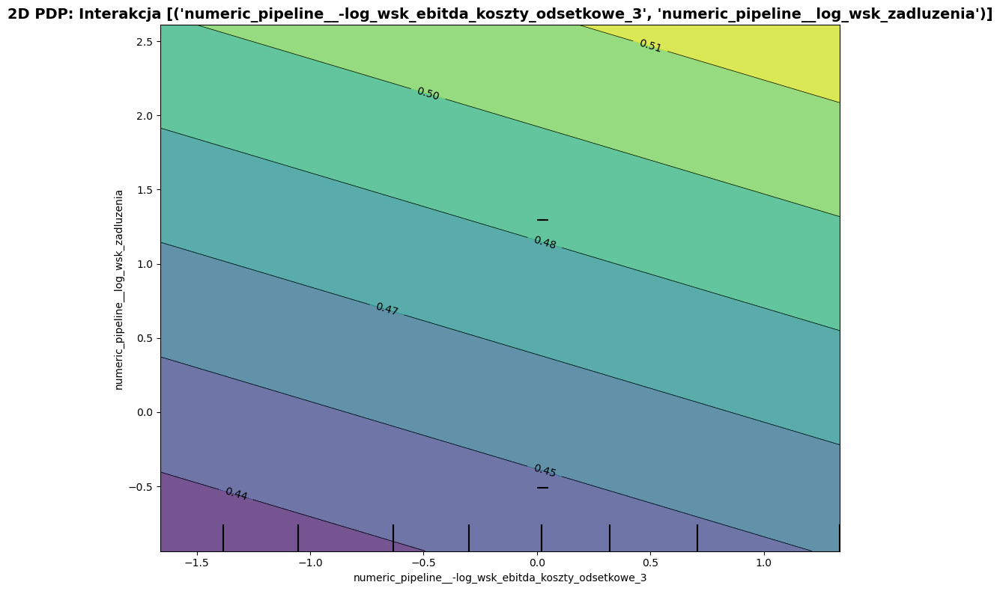

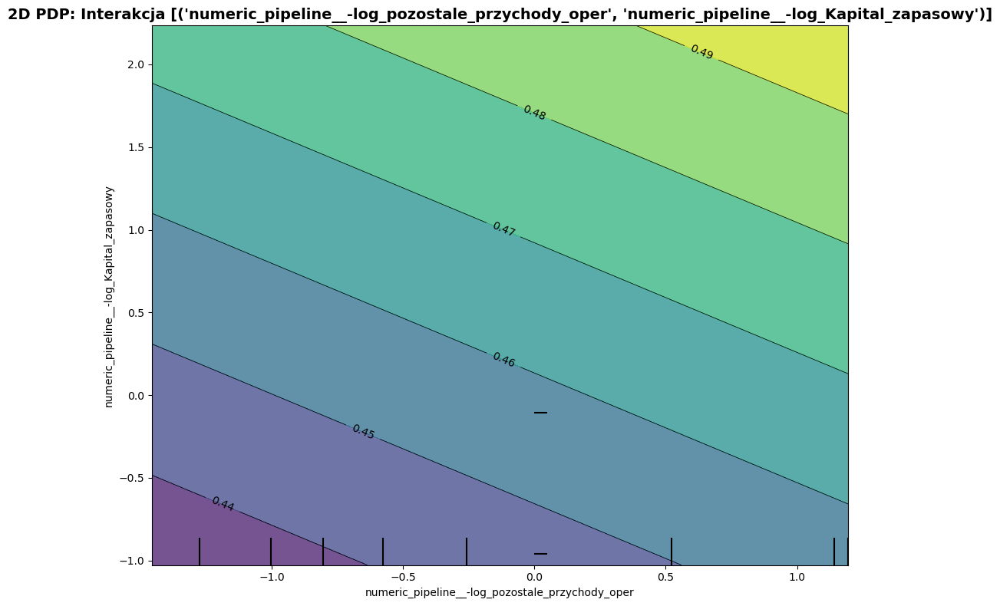

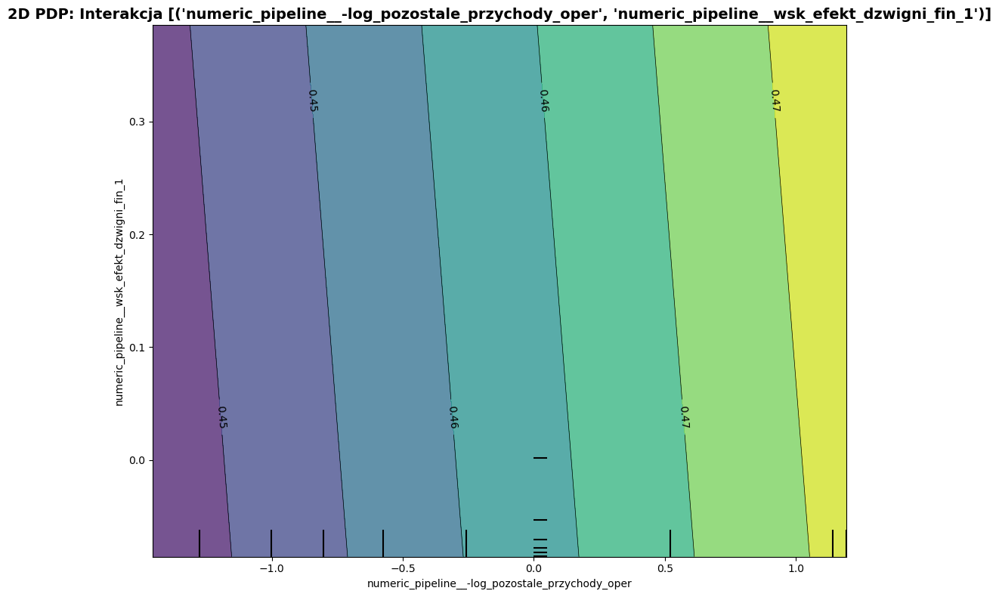

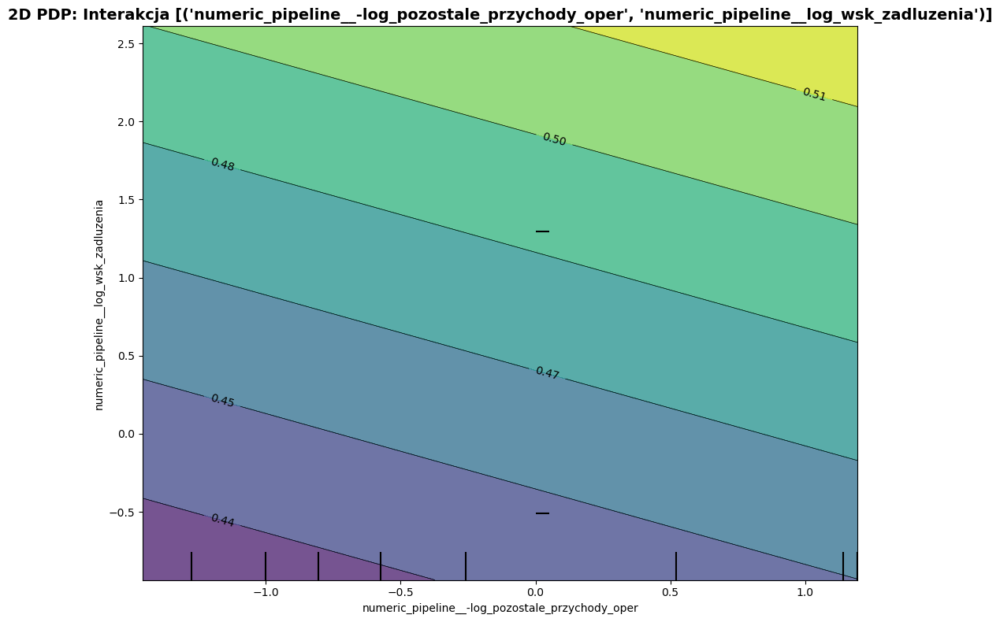

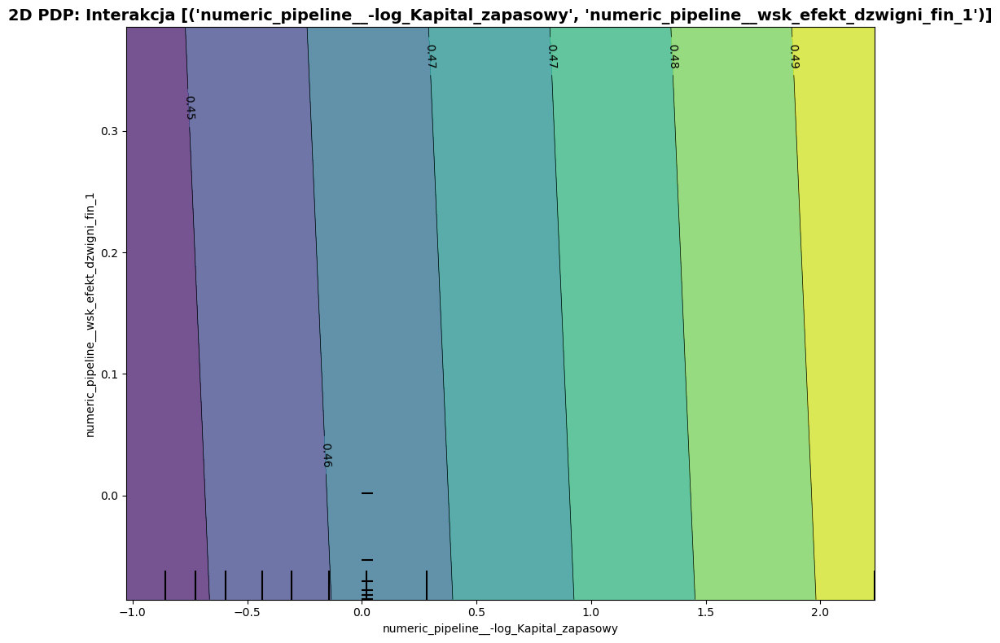

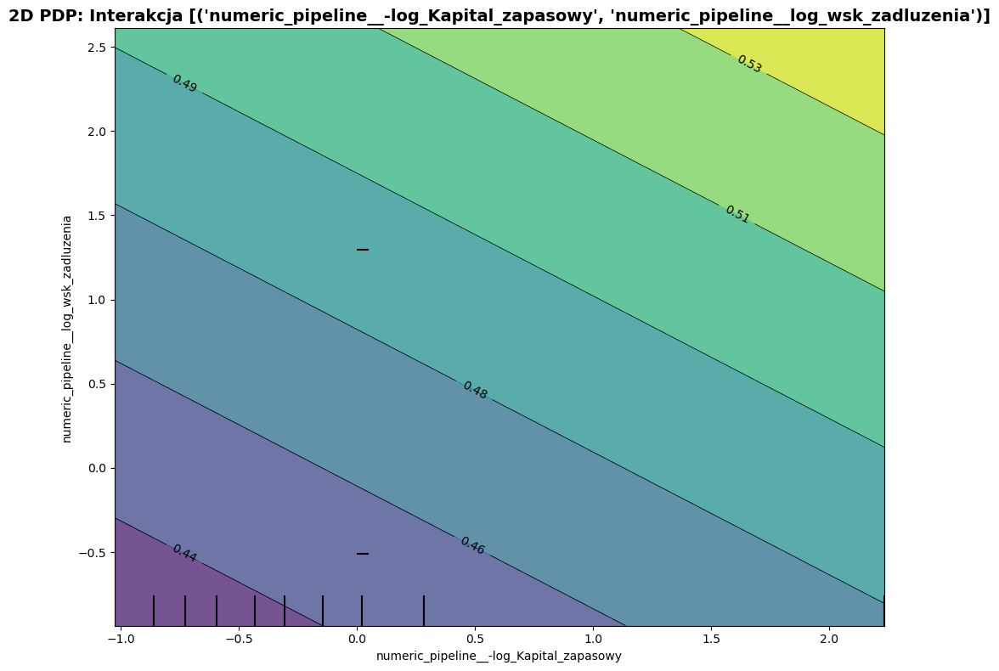

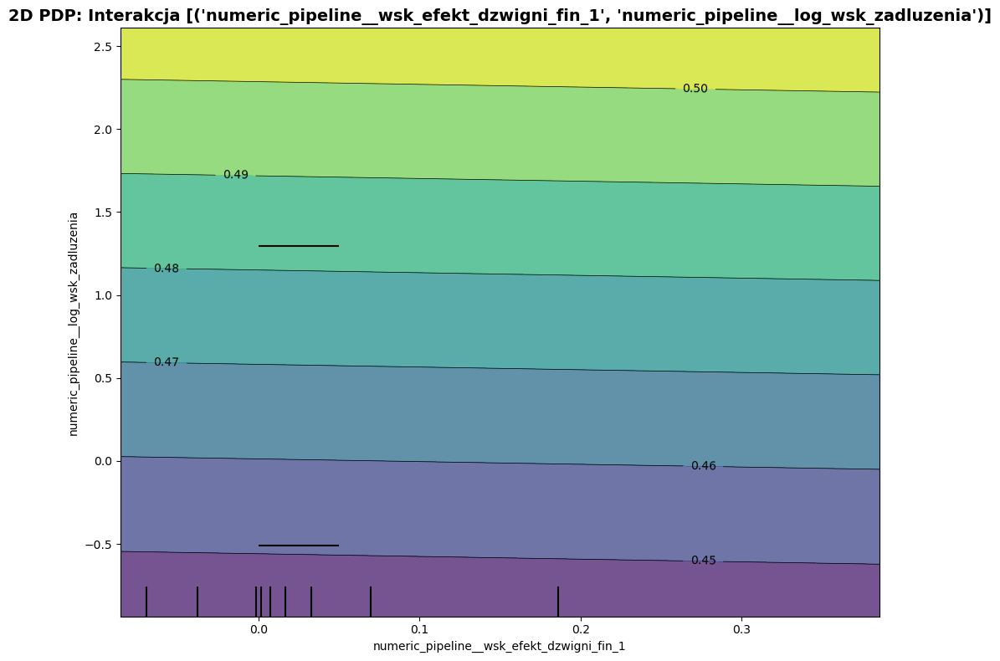

In [118]:
cols = ['numeric_pipeline__-log_wsk_ebitda_koszty_odsetkowe_3',
       'numeric_pipeline__-log_pozostale_przychody_oper',
       'numeric_pipeline__-log_Kapital_zapasowy',
       'numeric_pipeline__wsk_efekt_dzwigni_fin_1',
       'numeric_pipeline__log_wsk_zadluzenia']

from itertools import combinations

for pair in combinations(cols, 2):
    plot_2d_pdp(LR, X_train, [pair])

#### Obserwacja:
Widać, że w tym modelu raczej cechy nie wchodzą ze sobą w interakcje. Można wyróżnić pewne niewielkie obszary podwyższonego ryzyka.

## Lokalne wyjaśnienia

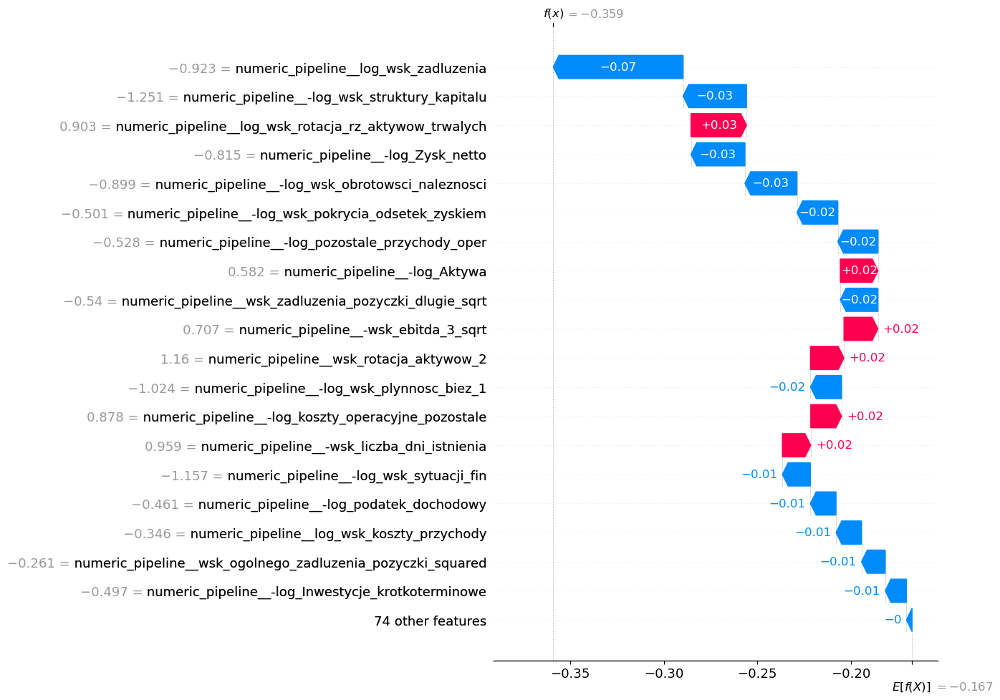

In [119]:
shap.plots.waterfall(shap_values_LR[0], max_display=20)

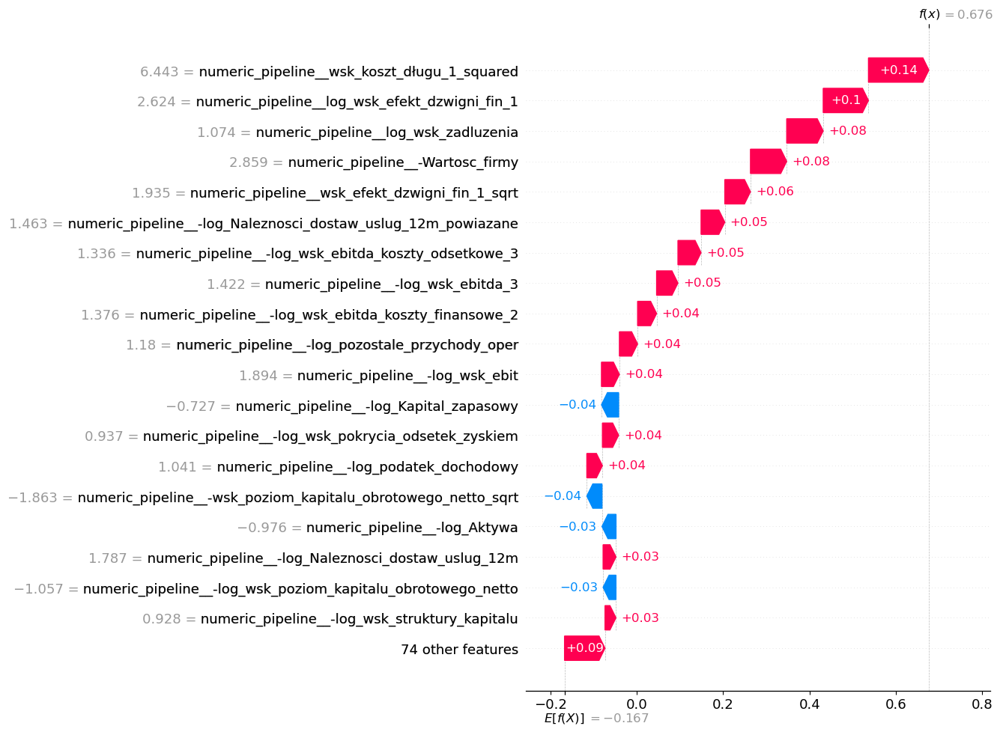

In [120]:
shap.plots.waterfall(shap_values_LR[1], max_display=20)

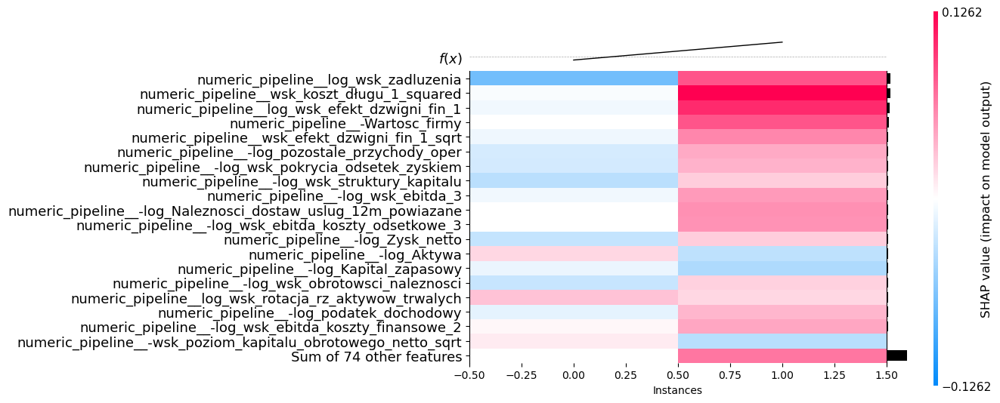

<Axes: xlabel='Instances'>

In [121]:
shap.plots.heatmap(shap_values_LR[[0, 1]], max_display=20)

Widzimy wpływy wartości różnych cech na finalną predykcję.

#### Min i Max PD

PD klienta o najwyższym ryzyku defaultu: 0.906

PD klienta o najniższym ryzyku defaultu: 0.000



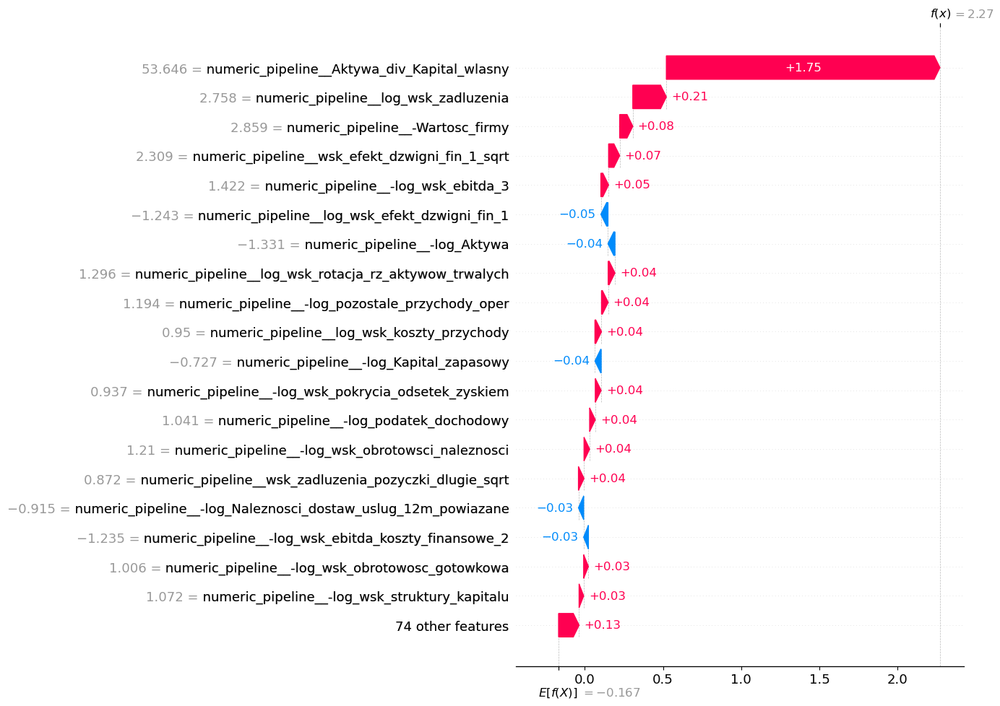

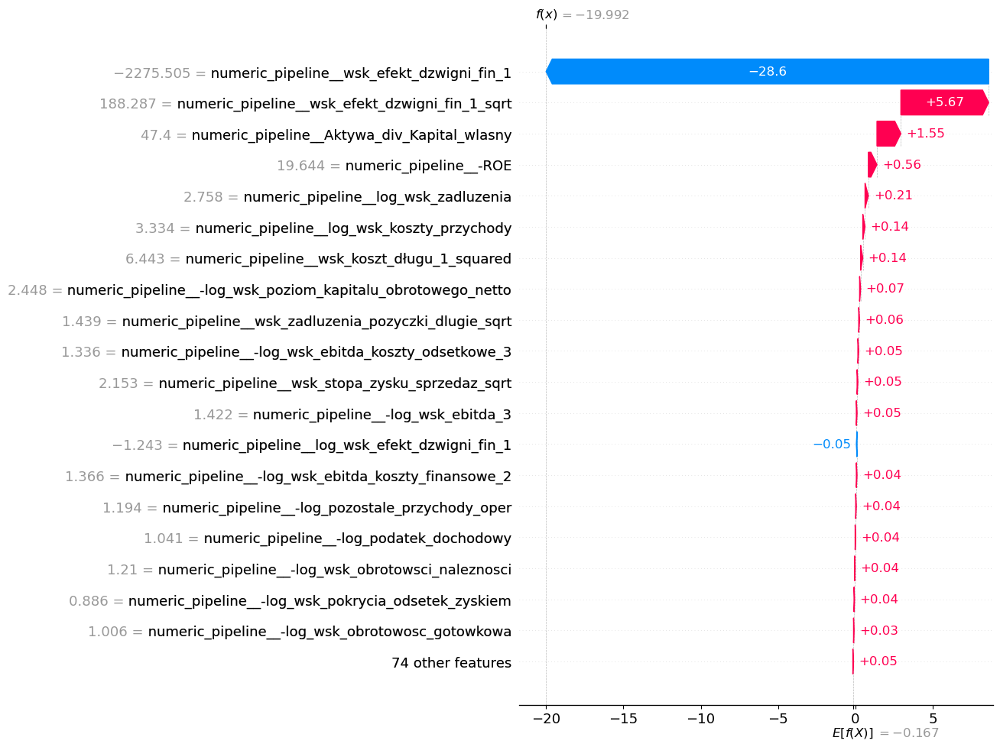

In [122]:
p_test_LR = LR.predict_proba(X_test)[:, 1]
idx_max, idx_min = find_max_and_min_risk_obs(shap_values_LR, p_test_LR, X_test)
# Waterfall plot
shap.plots.waterfall(shap_values_LR[idx_max], max_display=20)
shap.plots.waterfall(shap_values_LR[idx_min], max_display=20)

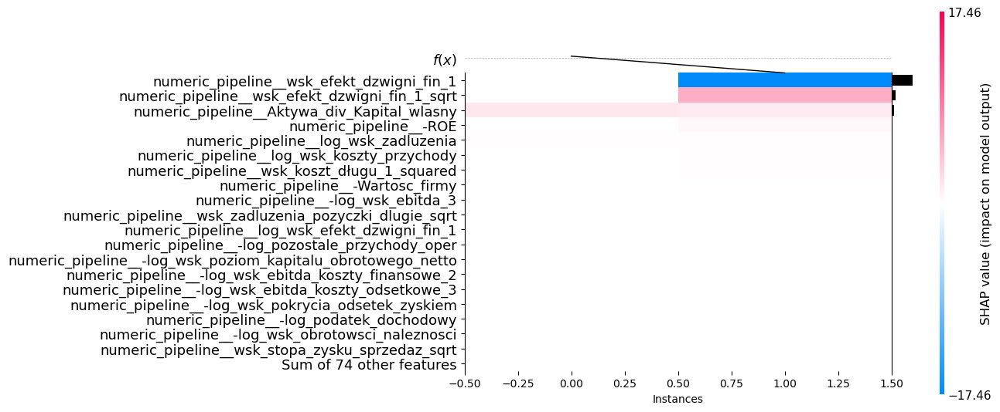

<Axes: xlabel='Instances'>

In [123]:
# Heatmapa dla 2 klientów (max PD i min PD)
shap.plots.heatmap(shap_values_LR[[idx_max, idx_min]], max_display=20)

Dla klienta o maksymalnym ryzyku defaultu top 3 cechy zwiększające ryzyko to:
- aktywa / kapitał własny
- logarytm wskaźnika zadłużenia,
- wartość firmy.

Dla klienta o najniższym prawdopodobieństwie defaultu przede wszystkim ryzyko zmniejsza efekt dźwigni finansowej.

#### Przypadki graniczne


5 przypadków najbliżej granicy:
Indeks: 339, PD: 0.4999


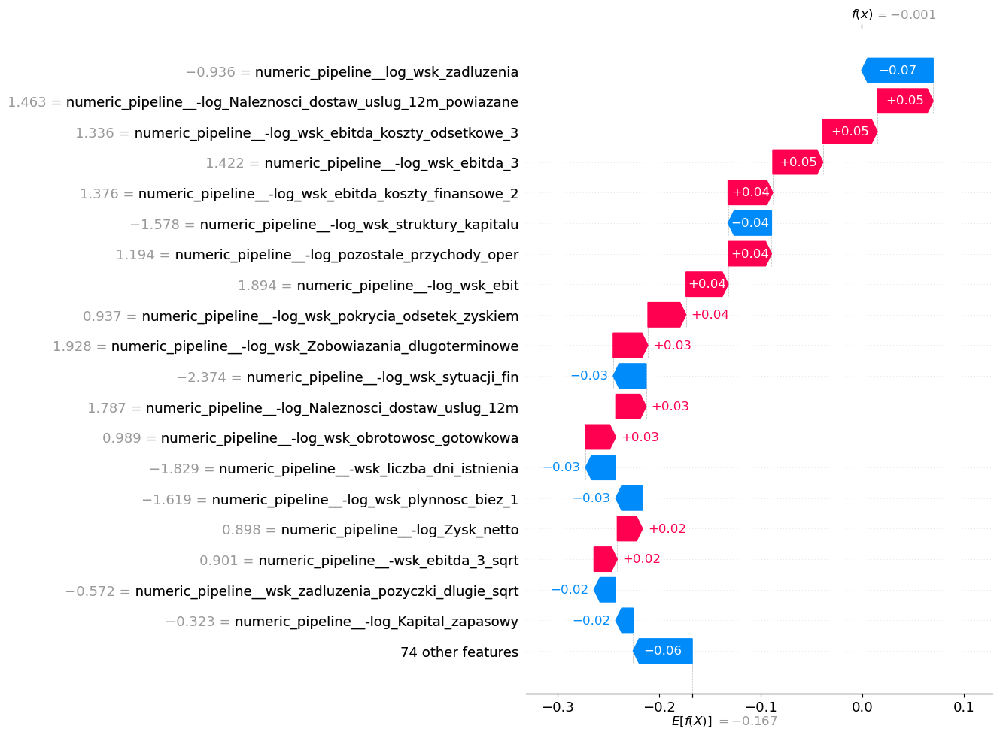

Indeks: 101, PD: 0.5003


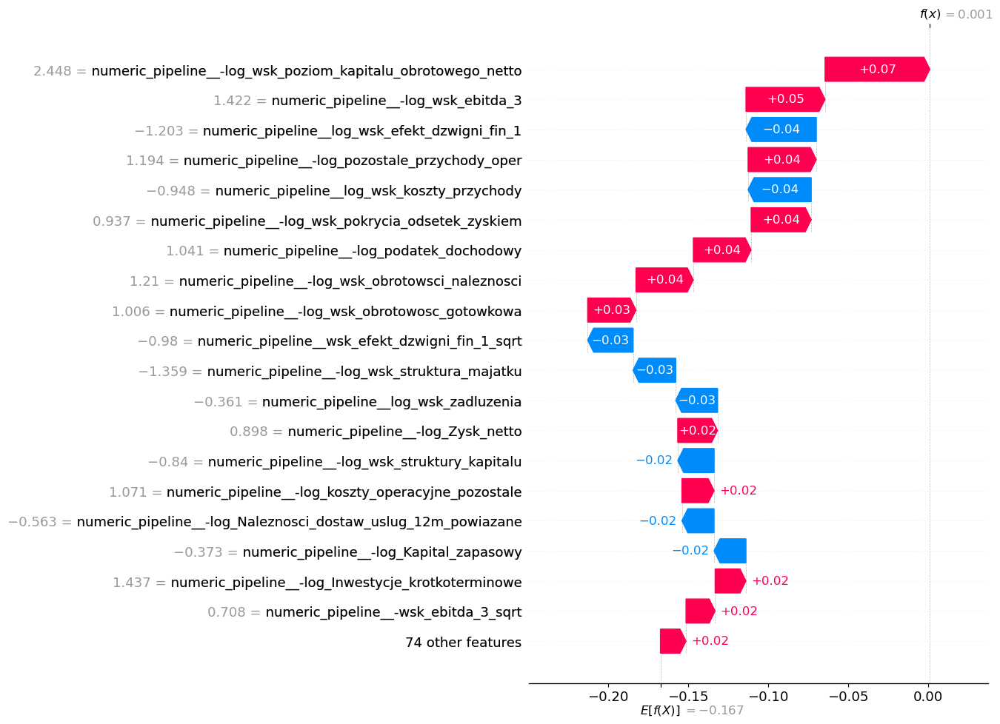

Indeks: 50, PD: 0.4996


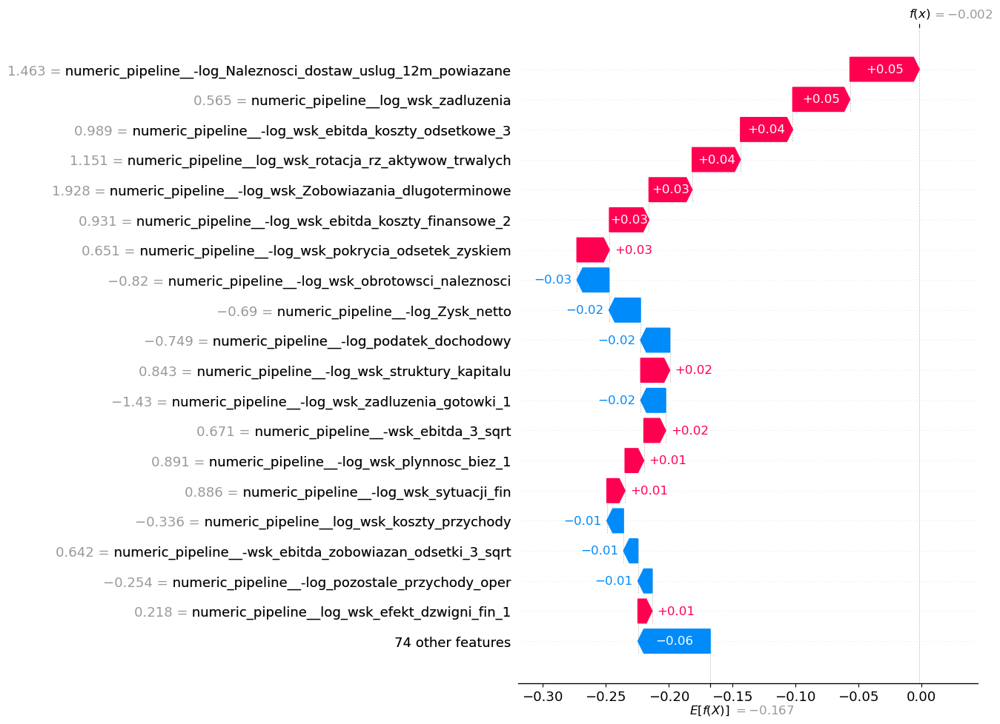

Indeks: 489, PD: 0.5005


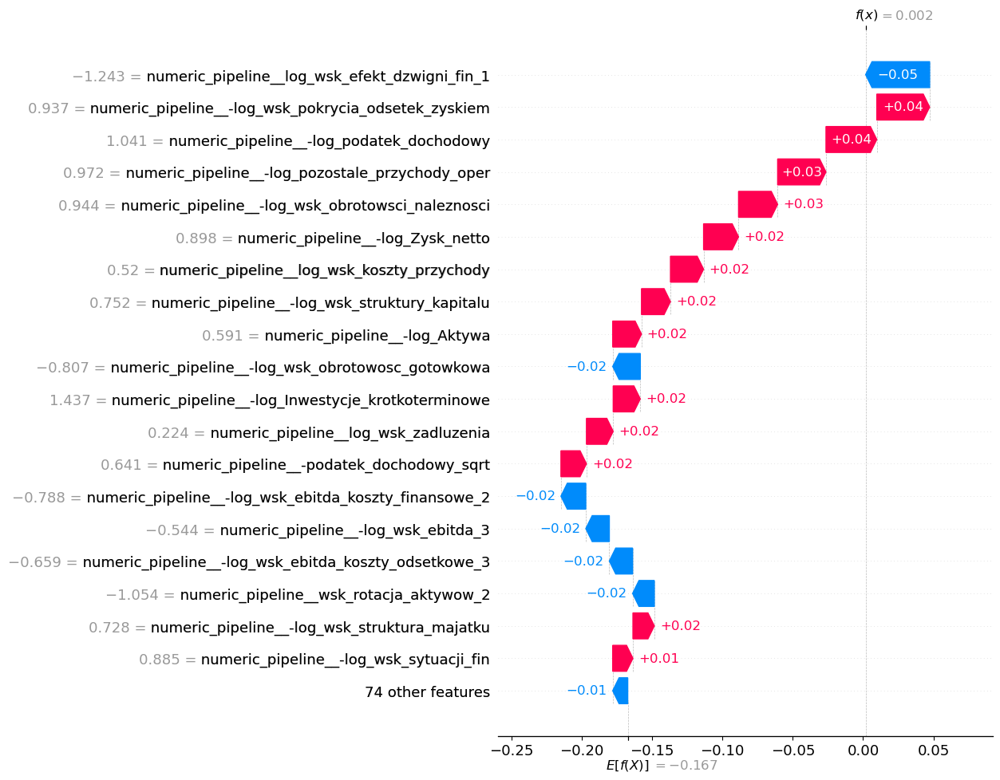

Indeks: 515, PD: 0.5006


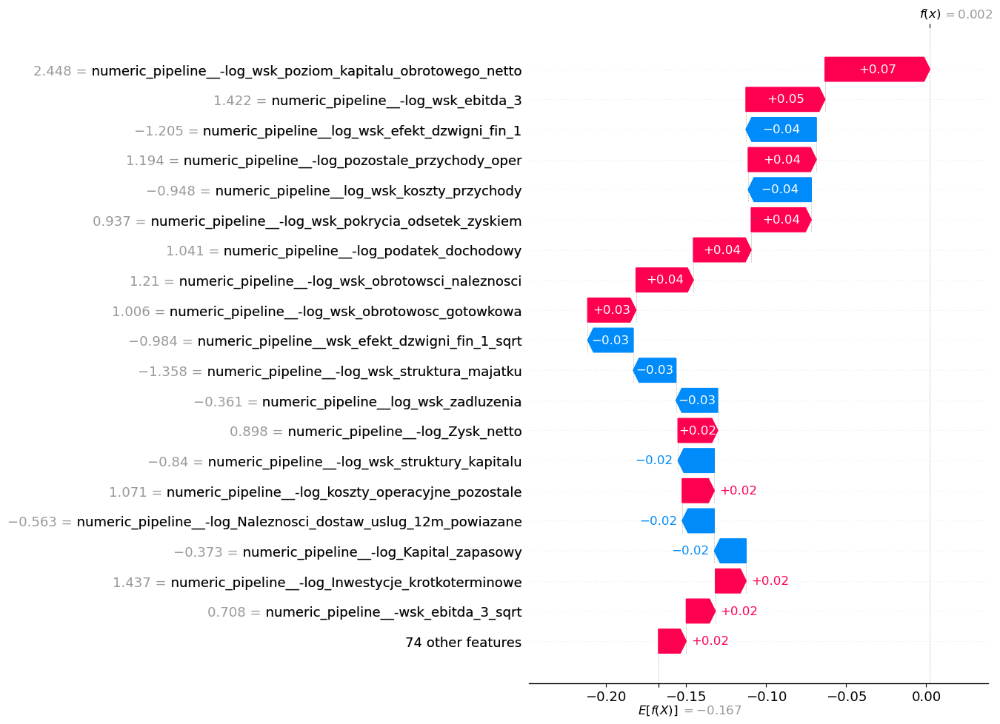

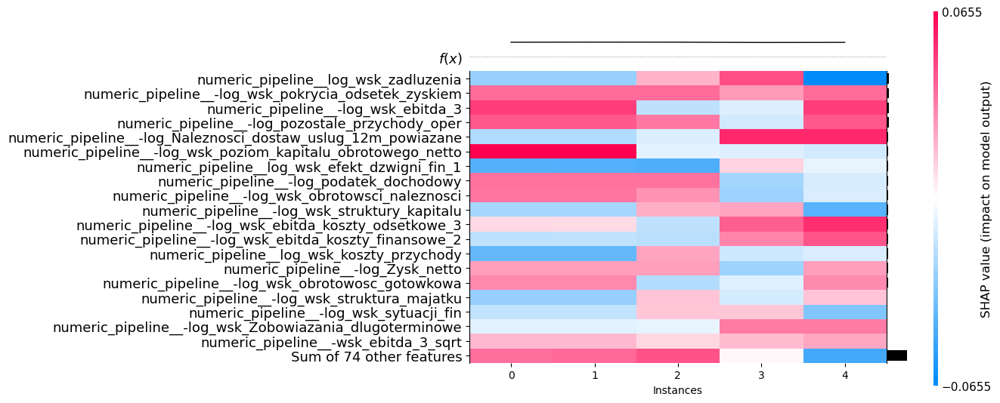

<Axes: xlabel='Instances'>

In [124]:
def get_top_n_borderline(y_proba, n=5, threshold=0.5):
    distances = np.abs(y_proba - threshold)
    
    # argsort zwraca indeksy posortowane od najmniejszej odległości
    sorted_indices = np.argsort(distances)
    
    # Bierzemy n pierwszych
    top_indices = sorted_indices[:n]
    
    return top_indices, y_proba[top_indices]

top_indices, top_probas = get_top_n_borderline(p_test_LR, n=5)

print("\n5 przypadków najbliżej granicy:")
for i, p in zip(top_indices, top_probas):
    print(f"Indeks: {i}, PD: {p:.4f}")
    shap.plots.waterfall(shap_values_LR[i], max_display=20)

shap.plots.heatmap(shap_values_LR[top_indices], max_display=20)

## Stabilność cech i predykcji

In [125]:
def calculate_psi_csi(model, X_train, X_test, features_to_check=None, buckets=10, epsilon=1e-4, mode='all'):
    """
    Oblicza PSI (dla modelu) i/lub CSI (dla cech).
    
    Parametry:
    - model: Obiekt modelu (może być None, jeśli mode='features')
    - mode: 'all' (domyślnie), 'model' (tylko wynik modelu), 'features' (tylko cechy)
    """
    
    # Walidacja trybu
    valid_modes = ['all', 'model', 'features']
    if mode not in valid_modes:
        raise ValueError(f"Nieznany tryb: {mode}. Dostępne: {valid_modes}")

    # --- Funkcja pomocnicza PSI ---
    def get_psi_value(expected_array, actual_array, buckets):
        try:
            _, bins = pd.qcut(expected_array, q=buckets, retbins=True, duplicates='drop')
        except ValueError:
            bins = np.linspace(np.min(expected_array), np.max(expected_array), buckets+1)
        
        bins[0] = -np.inf
        bins[-1] = np.inf
        
        expected_binned = pd.cut(expected_array, bins=bins, include_lowest=True)
        actual_binned = pd.cut(actual_array, bins=bins, include_lowest=True)
        
        exp_dist = pd.Series(expected_binned).value_counts(normalize=True, sort=False)
        act_dist = pd.Series(actual_binned).value_counts(normalize=True, sort=False)
        
        all_cats = exp_dist.index.union(act_dist.index)
        exp_dist = exp_dist.reindex(all_cats, fill_value=0) + epsilon
        act_dist = act_dist.reindex(all_cats, fill_value=0) + epsilon
        
        psi_values = (act_dist - exp_dist) * np.log(act_dist / exp_dist)
        return psi_values.sum()

    results = []
    
    # --- 1. PSI dla MODELU (tylko w trybie 'all' lub 'model') ---
    if mode in ['all', 'model']:
        if model is None:
            print("BŁĄD: Wybrano tryb badania modelu, ale nie podano obiektu modelu (model=None).")
            return pd.DataFrame()
            
        if hasattr(model, "predict_proba"):
            prob_train = model.predict_proba(X_train)[:, 1]
            prob_test = model.predict_proba(X_test)[:, 1]
        else:
            prob_train = model.predict(X_train)
            prob_test = model.predict(X_test)
            
        psi_model = get_psi_value(prob_train, prob_test, buckets)
        results.append({"Typ": "Model Score", "Nazwa": "Predykcja", "PSI/CSI": psi_model})
    
    # --- 2. CSI dla CECH (tylko w trybie 'all' lub 'features') ---
    if mode in ['all', 'features']:
        if features_to_check is None:
            cols_iter = X_train.columns
        else:
            cols_iter = [c for c in features_to_check if c in X_train.columns]
            
        print(f"Obliczanie CSI dla {len(cols_iter)} cech (tryb: {mode})...")
        
        for col in cols_iter:
            val_train = X_train[col].values
            val_test = X_test[col].values
            csi_val = get_psi_value(val_train, val_test, buckets)
            results.append({"Typ": "Cecha", "Nazwa": col, "PSI/CSI": csi_val})
        
    # --- 3. Formatowanie i Wyświetlanie ---
    if not results:
        print("Brak wyników do wyświetlenia.")
        return pd.DataFrame()

    df_res = pd.DataFrame(results)
    
    def get_status(value):
        if value < 0.1: return "Stabilny"
        elif value < 0.25: return "Ostrzeżenie"
        else: return "KRYTYCZNY"

    df_res["Status"] = df_res["PSI/CSI"].apply(get_status)
    
    # Sortowanie
    df_final = df_res.sort_values(["Typ", "PSI/CSI"], ascending=[True, False]).reset_index(drop=True)
    
    def highlight_status(val):
        if val == "Stabilny": return "background-color: #d4edda; color: green"
        elif val == "Ostrzeżenie": return "background-color: #fff3cd; color: #856404"
        else: return "background-color: #f8d7da; color: #721c24; font-weight: bold"

    print(f"\n=== Raport Stabilności (Tryb: {mode.upper()}) ===")
    
    try:
        styled_df = df_final.style.map(highlight_status, subset=["Status"])
    except AttributeError:
        styled_df = df_final.style.applymap(highlight_status, subset=["Status"])
        
    display(styled_df.format({"PSI/CSI": "{:.4f}"}))
            
    return df_final

In [126]:
# Stabilność cech
df_report = calculate_psi_csi(LR, X_train, X_test, mode='features')
unstable_features = df_report[df_report["PSI/CSI"] > 0.1]

if not unstable_features.empty:
    print("ZNALEZIONO NIESTABILNE CECHY!")
    display(unstable_features)
else:
    print("Wszystkie 81 cech jest stabilnych.")

Obliczanie CSI dla 93 cech (tryb: features)...

=== Raport Stabilności (Tryb: FEATURES) ===


,Typ,Nazwa,PSI/CSI,Status
0,Cecha,numeric_pipeline__-Naleznosci_dostaw_uslug_pow12m_pozostale_squared,0.0339,Stabilny
1,Cecha,numeric_pipeline__-Aktywa_trwale_to_assets,0.0328,Stabilny
2,Cecha,numeric_pipeline__wsk_Zobowiazania_dlugoterminowe_squared,0.0299,Stabilny
3,Cecha,numeric_pipeline__-log_wsk_ebitda_koszty_odsetkowe_3,0.0292,Stabilny
4,Cecha,numeric_pipeline__-wsk_rotacja_wartosci_niewaterialnych_squared,0.0289,Stabilny
5,Cecha,numeric_pipeline__-log_wsk_Zobowiazania_dlugoterminowe,0.0285,Stabilny
6,Cecha,numeric_pipeline__wsk_ebitda_koszty_odsetkowe_2_sqrt,0.0283,Stabilny
7,Cecha,numeric_pipeline__wsk_stopa_zysku_sprzedaz_sqrt,0.0280,Stabilny
8,Cecha,numeric_pipeline__-current_ratio,0.0279,Stabilny
9,Cecha,numeric_pipeline__-log_Aktywa,0.0259,Stabilny


Wszystkie 81 cech jest stabilnych.


In [127]:
# Regresja 
lr_report = calculate_psi_csi(LR, X_train, X_test, mode='model')


=== Raport Stabilności (Tryb: MODEL) ===


,Typ,Nazwa,PSI/CSI,Status
0,Model Score,Predykcja,0.0330,Stabilny


In [128]:
clr_report = calculate_psi_csi(CLR, X_train, X_test, mode='model')


=== Raport Stabilności (Tryb: MODEL) ===


,Typ,Nazwa,PSI/CSI,Status
0,Model Score,Predykcja,0.0330,Stabilny


## Równość i stabilność podgrup

In [129]:
def subgroup_audit(model, X, y, segment_col_name, segment_values):
    """
    model: Twój wytrenowany model
    segment_values: pd.Series z nazwami segmentów (np. X_test['Branza'])
    """
    results = []
    
    # Globalny wynik
    probs = model.predict_proba(X)[:, 1]
    global_auc = roc_auc_score(y, probs)
    
    unique_segments = segment_values.unique()
    
    for seg in unique_segments:
        mask = (segment_values == seg)
        if mask.sum() < 30: continue # Zbyt mała próba
            
        y_seg = y[mask]
        X_seg = X[mask]
        probs_seg = model.predict_proba(X_seg)[:, 1]
        
        auc = roc_auc_score(y_seg, probs_seg)
        brier = brier_score_loss(y_seg, probs_seg)
        mean_pd = probs_seg.mean()
        actual_dr = y_seg.mean()
        
        results.append({
            'Segment': seg,
            'Liczebność': mask.sum(),
            'AUC': auc,
            'Brier': brier,
            'Średnie PD': mean_pd,
            'Rzeczywisty DR': actual_dr,
            'Różnica vs Global AUC': auc - global_auc
        })
        
    return pd.DataFrame(results).sort_values('AUC')

# Użycie:
#audit_df = subgroup_audit(LR, X_test, y_test, 'numeric_pipeline__Aktywa_div_Kapital_wlasny', X_test['numeric_pipeline__Aktywa_div_Kapital_wlasny'])
features_list_lr = mean_shap_LR.tail(5)['feature'].tolist()[::-1]
# Zakładamy, że masz już listę 'top_features' z Kroku 1
# oraz funkcję 'subgroup_audit' zdefiniowaną wcześniej

for col in features_list_lr:
    print(f"--- Audyt dla cechy: {col} ---")
    
    # Sprawdzamy, czy cecha jest numeryczna (ciągła) czy kategoryczna
    if pd.api.types.is_numeric_dtype(X_test[col]) and X_test[col].nunique() > 10:
        # DLA CIĄGŁYCH: Dzielimy na 4 kwartyle (Low, Mid-Low, Mid-High, High)
        # qcut dzieli na grupy o równej liczebności
        try:
            segment_values = pd.qcut(X_test[col], q=4, labels=['Q1 (Niskie)', 'Q2', 'Q3', 'Q4 (Wysokie)'])
        except ValueError:
            # Fallback jeśli zbyt mało unikalnych wartości na qcut
            segment_values = pd.cut(X_test[col], bins=4)
    else:
        # DLA KATEGORYCZNYCH: Bierzemy jak leci
        segment_values = X_test[col]
    
    # Uruchamiamy audyt
    audit_results = subgroup_audit(LR, X_test, y_test, col, segment_values)
    
    # Wyświetlamy tylko jeśli są jakieś wyniki
    if not audit_results.empty:
        display(audit_results)
    else:
        print("Zbyt małe podgrupy do analizy.")
    print("\n")

--- Audyt dla cechy: numeric_pipeline__log_wsk_zadluzenia ---


,Segment,Liczebność,AUC,Brier,Średnie PD,Rzeczywisty DR,Różnica vs Global AUC
0,Q1 (Niskie),150,0.675945,0.189666,0.416396,0.093333,-0.069388
1,Q4 (Wysokie),150,0.706051,0.253269,0.532294,0.246667,-0.039282
3,Q3,150,0.714206,0.201422,0.439329,0.086667,-0.031128
2,Q2,150,0.789916,0.198948,0.441500,0.093333,0.044582




--- Audyt dla cechy: numeric_pipeline__wsk_efekt_dzwigni_fin_1 ---


,Segment,Liczebność,AUC,Brier,Średnie PD,Rzeczywisty DR,Różnica vs Global AUC
2,Q1 (Niskie),150,0.632000,0.252830,0.504374,0.166667,-0.113334
1,Q4 (Wysokie),150,0.730202,0.236333,0.505232,0.180000,-0.015132
0,Q2,150,0.775407,0.180137,0.411685,0.086667,0.030074
3,Q3,150,0.851207,0.174005,0.408228,0.086667,0.105874




--- Audyt dla cechy: numeric_pipeline__-log_Kapital_zapasowy ---


,Segment,Liczebność,AUC,Brier,Średnie PD,Rzeczywisty DR,Różnica vs Global AUC
0,Q3,150,0.629630,0.245013,0.494156,0.180000,-0.115704
3,Q4 (Wysokie),150,0.693591,0.267168,0.546455,0.213333,-0.051742
2,Q2,150,0.715328,0.195701,0.435928,0.086667,-0.030005
1,Q1 (Niskie),150,0.725694,0.135422,0.352980,0.040000,-0.019639




--- Audyt dla cechy: numeric_pipeline__-log_wsk_pokrycia_odsetek_zyskiem ---


,Segment,Liczebność,AUC,Brier,Średnie PD,Rzeczywisty DR,Różnica vs Global AUC
3,"(-2.603, -1.715]",34,0.580645,0.210895,0.443169,0.088235,-0.164688
0,"(-0.831, 0.0529]",102,0.696241,0.183662,0.414205,0.068627,-0.049093
1,"(0.0529, 0.937]",334,0.707968,0.241845,0.505011,0.179641,-0.037365
2,"(-1.715, -0.831]",130,0.775615,0.152428,0.372595,0.061538,0.030281




--- Audyt dla cechy: numeric_pipeline__-log_pozostale_przychody_oper ---


,Segment,Liczebność,AUC,Brier,Średnie PD,Rzeczywisty DR,Różnica vs Global AUC
1,"(0.532, 1.194]",255,0.636021,0.256867,0.518912,0.192157,-0.109312
2,"(-1.458, -0.793]",181,0.797590,0.150539,0.373195,0.082873,0.052257
0,"(-0.793, -0.131]",132,0.800361,0.203635,0.448820,0.068182,0.055028
3,"(-0.131, 0.532]",32,0.866667,0.214601,0.478517,0.156250,0.121333


#### Wnioski:
Cechy są raczej stabilne w podgrupach.

# Model black-box (XGBoost)

## Globalne wyjaśnienia

### Ważnośc cech

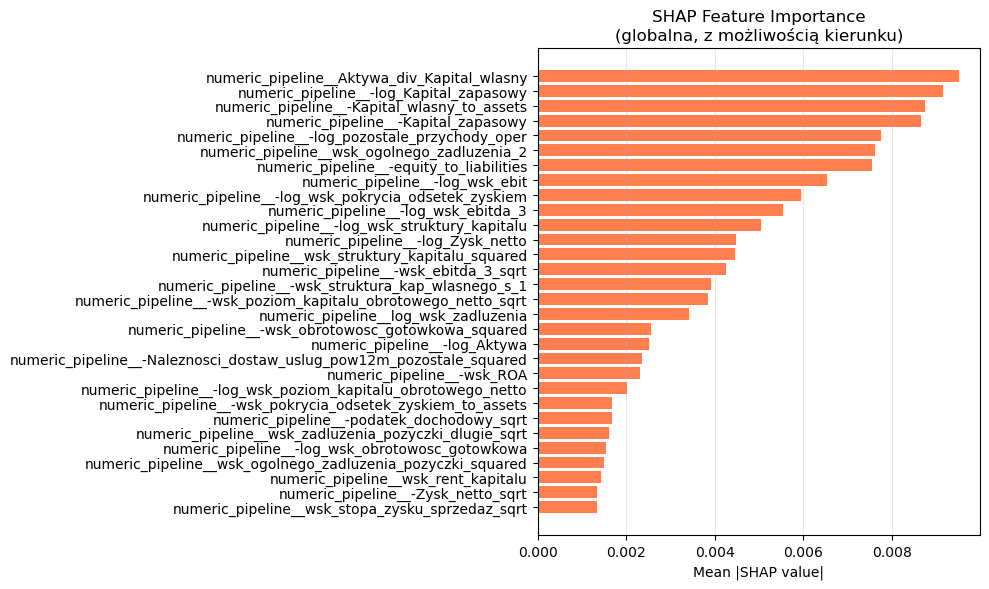

In [130]:
mean_shap_XGB = plot_mean_shap(shap_vals_XGB, X_test, 30)

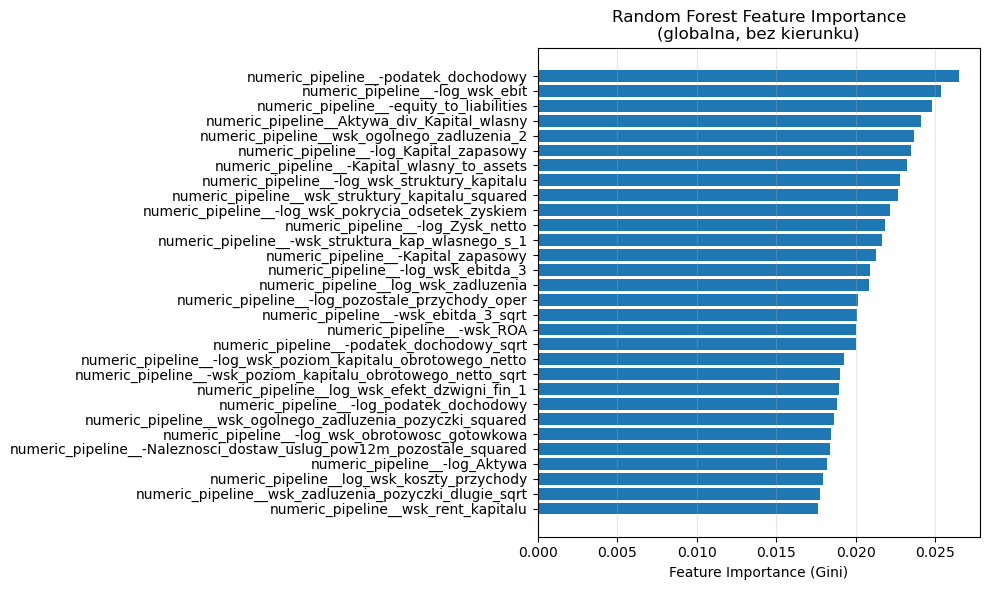

In [131]:
tree_fi_XGB = plot_tree_model_feature_importances(XGB, X_test, 30)

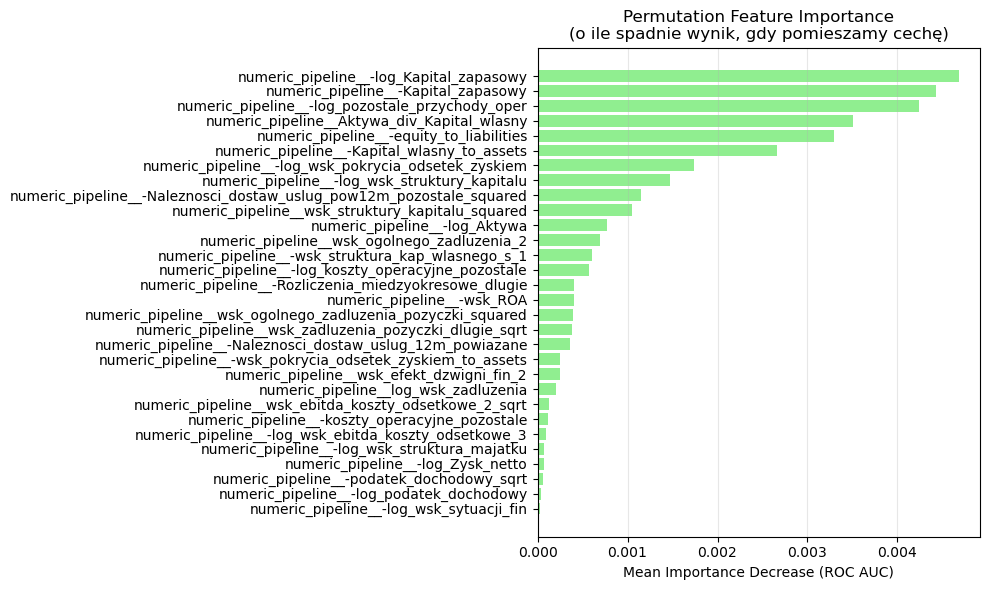

In [132]:
perm_imp_XGB = plot_permutation_importance(XGB, X_test, y_test, top_n=30)

#### Obserwacja:
Widać różnice w ważności cech w zależności od użytej metody, Tree Feature Importance jest raczej mało konkretny, nie wskazuje cech bardzo wybijających się ponad inne. W przypadku SHAP i PI widzimy, że niektórym cechom przypisany został znacząco większy wpływ niż innym.

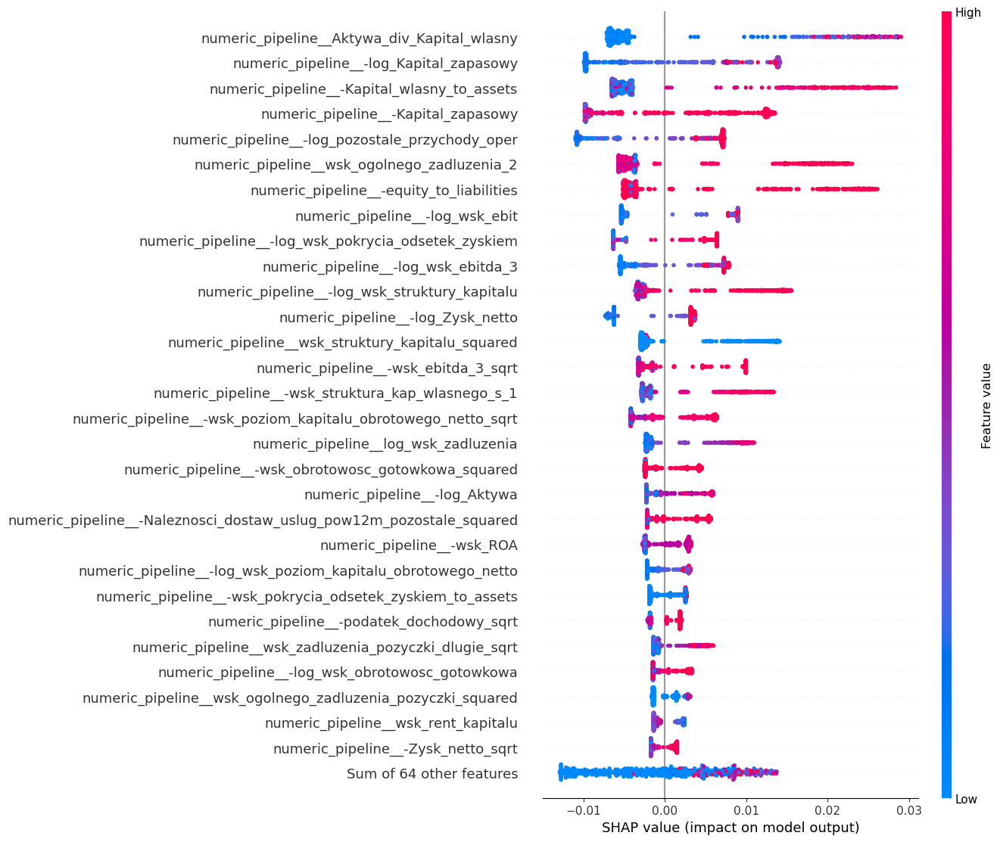

In [133]:
shap.plots.beeswarm(shap_values_XGB, max_display=30)

#### Obserwacja:
Widzimy spory rozrzut wartości SHAP dla pojedynczych cech. Cechy te mogą mieć wysoki wpływ na predykcje. Raczej nie widać tutaj nietrywialnych zależności pokroju U-kształtnych zmiennych.

### Patrial Dependence

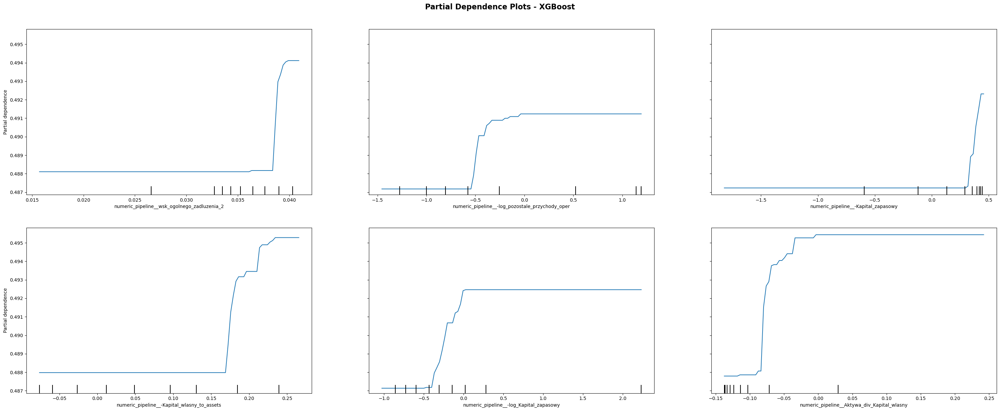

In [134]:
pdp_plot_for_top_features(XGB, X_train, mean_shap_XGB.tail(6)['feature'].values, "XGBoost")

#### Obserwacja:
Widać, że model drzewiasty wyłapał nieliniowe zależności. Widać, że wśród zmiennych występuje chociażby efekt plateau (w pewnym momencie mimo wzrostu wartości wynik/wpływ pozostaje już bez zmian na podobnym poziomie) czy thresholdu (dopiero od pewnego momentu zaczyna być widoczny wpływ wartości cechy).

## Centered ICE

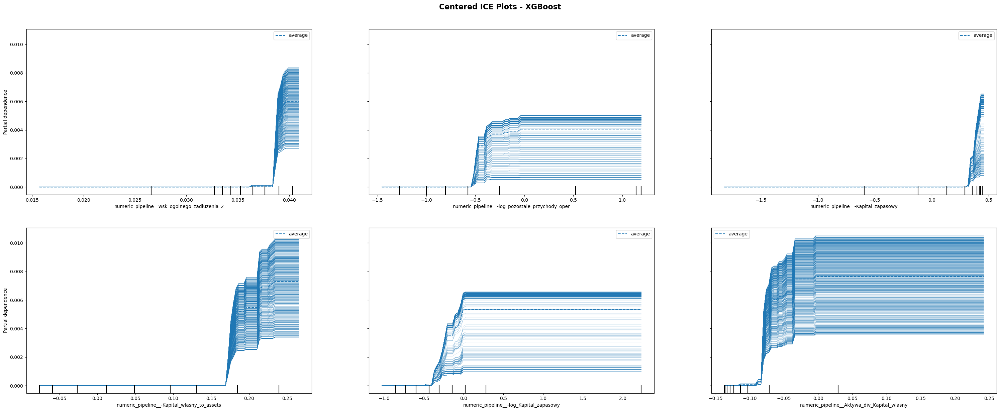

In [135]:
centered_ice_plot(XGB, X_train, mean_shap_XGB.tail(6)['feature'].values, "XGBoost")

#### Obserwacja:
Linie ICE są schodkowe, widzimy nieliniowe wpływy i potencjalne efekty progowe.

In [136]:
mean_shap_XGB.tail(5)['feature'].values

array(['numeric_pipeline__-log_pozostale_przychody_oper',
       'numeric_pipeline__-Kapital_zapasowy',
       'numeric_pipeline__-Kapital_wlasny_to_assets',
       'numeric_pipeline__-log_Kapital_zapasowy',
       'numeric_pipeline__Aktywa_div_Kapital_wlasny'], dtype=object)

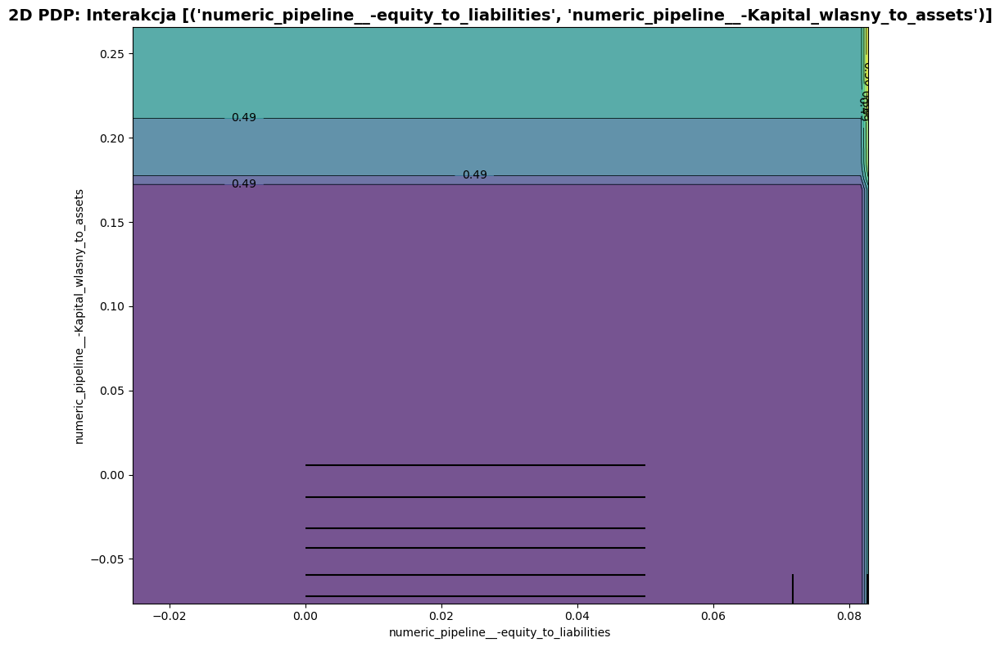

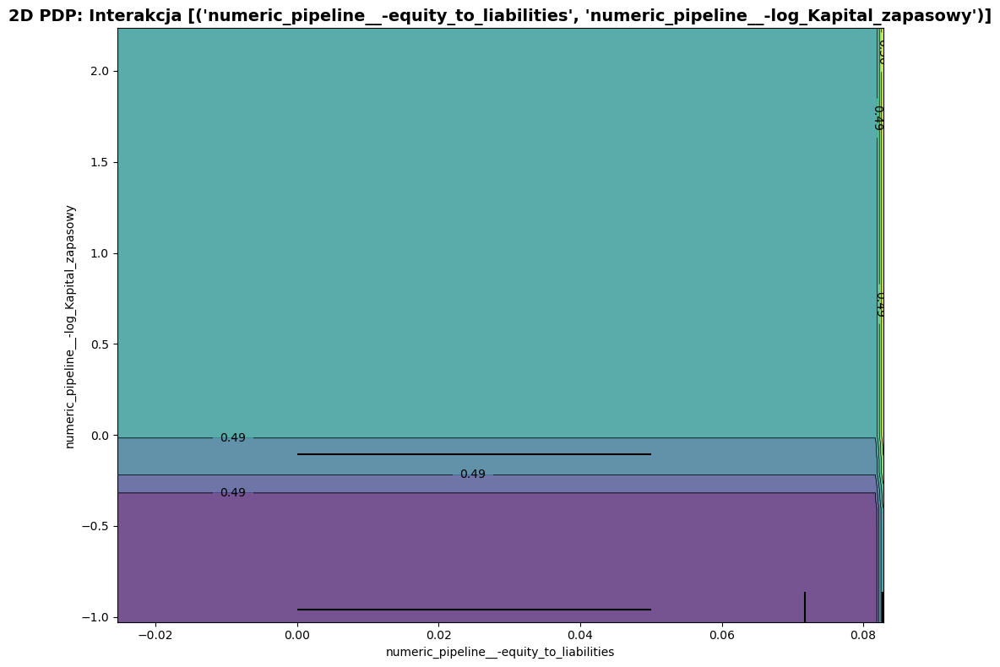

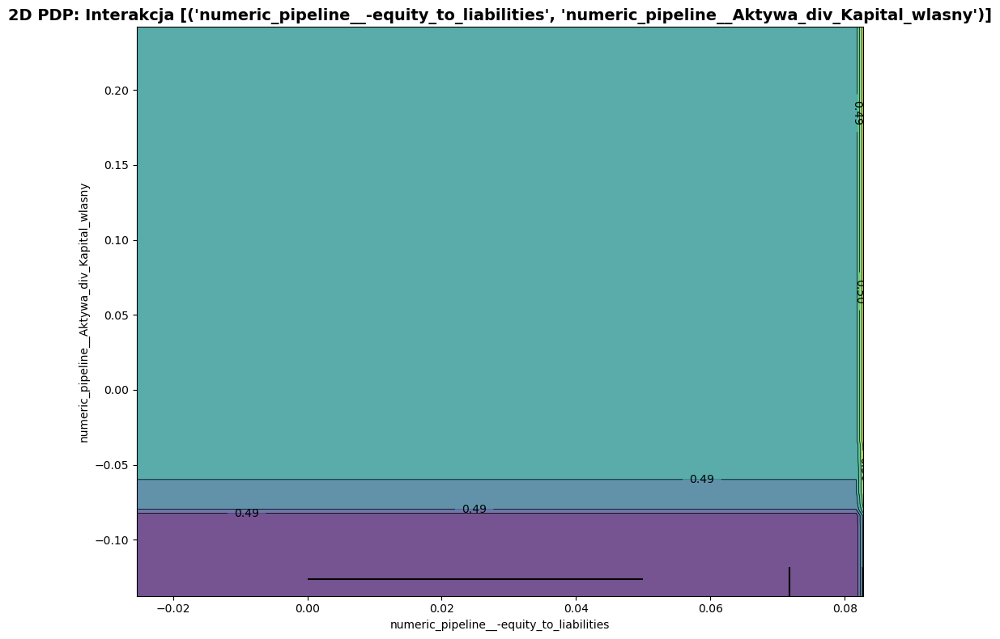

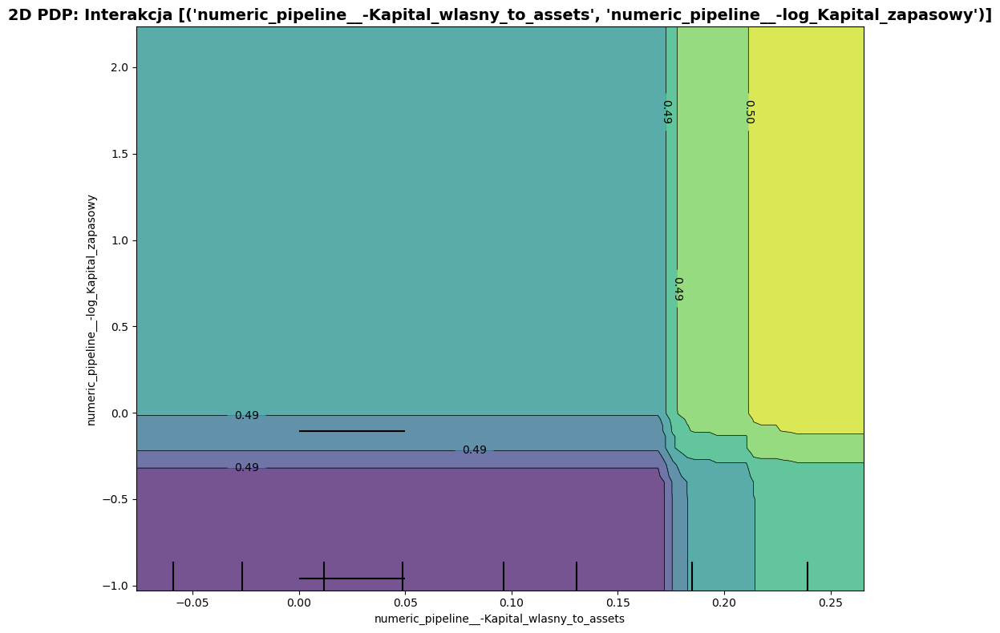

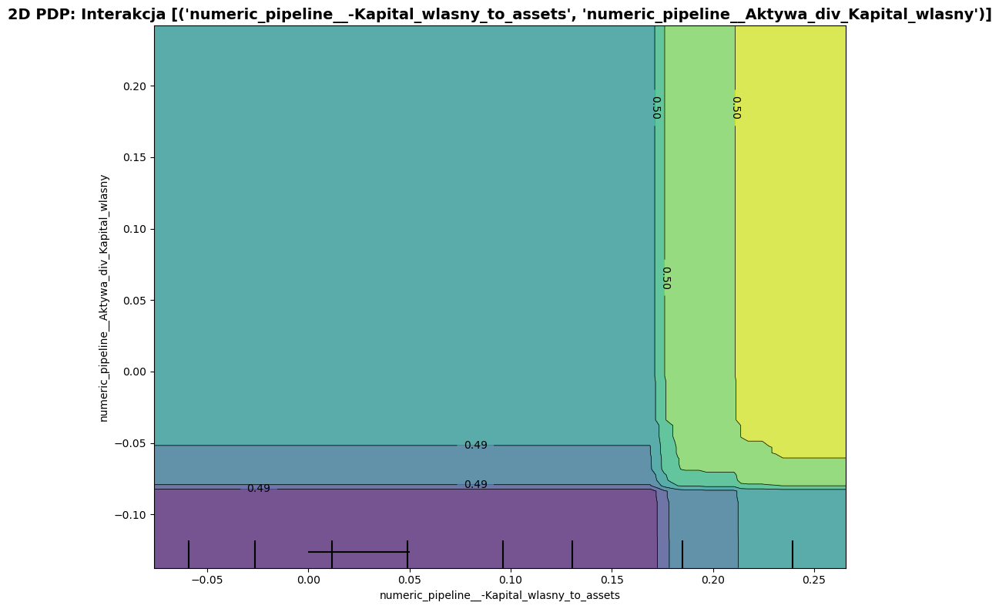

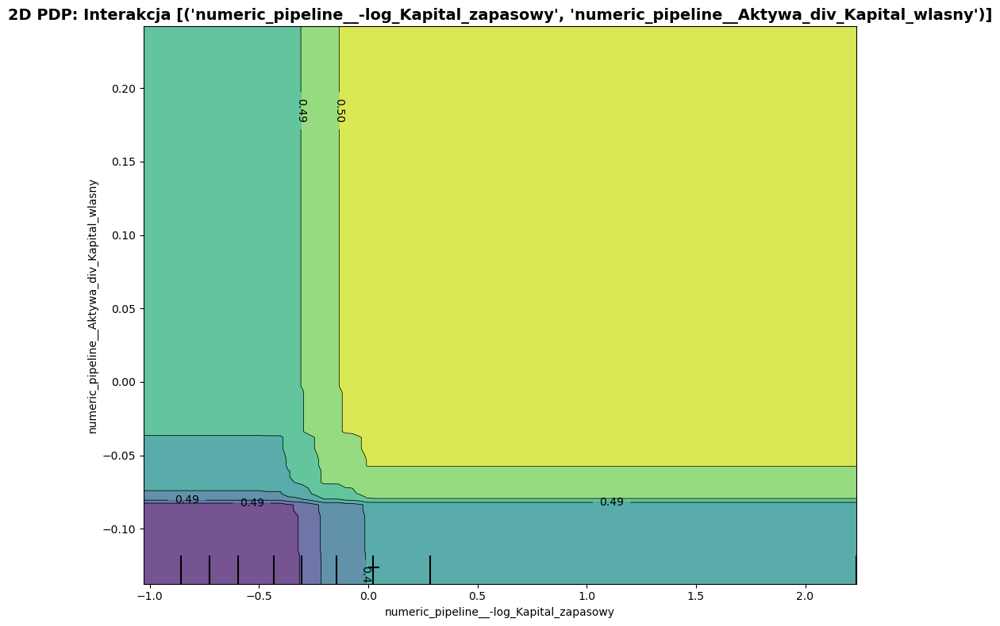

In [137]:
cols = ['numeric_pipeline__-equity_to_liabilities',
       'numeric_pipeline__-Kapital_wlasny_to_assets',
       'numeric_pipeline__-log_Kapital_zapasowy',
       'numeric_pipeline__Aktywa_div_Kapital_wlasny']

from itertools import combinations

for pair in combinations(cols, 2):
    plot_2d_pdp(XGB, X_train, [pair])

#### Obserwacja:
Na wykresach 2D PDP widzimy, że niektóre cechy nie wchodzą w interakcje (np. wzrost cechy '-equity_to_liabilities' nie wpływa na '-Kapital_wlasny_to_assets'), jednak w niektórych przypadkach tworzą się grupy podwyższonego ryzyka, a obszary te znacznie różnią się od widzianych w przypadku regresji.

## Lokalne wyjaśnienia

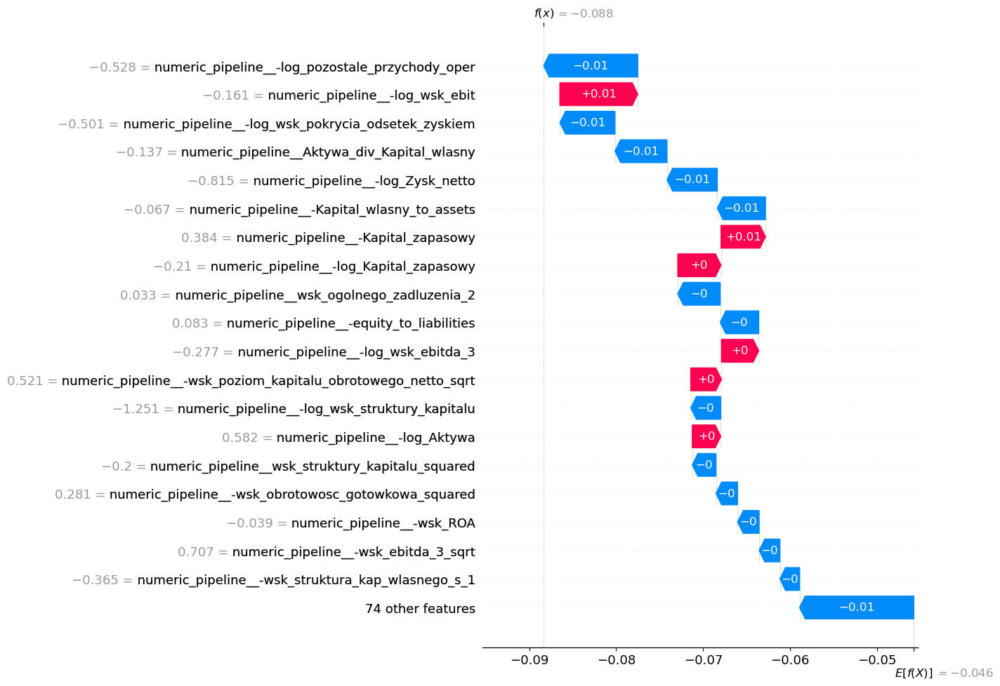

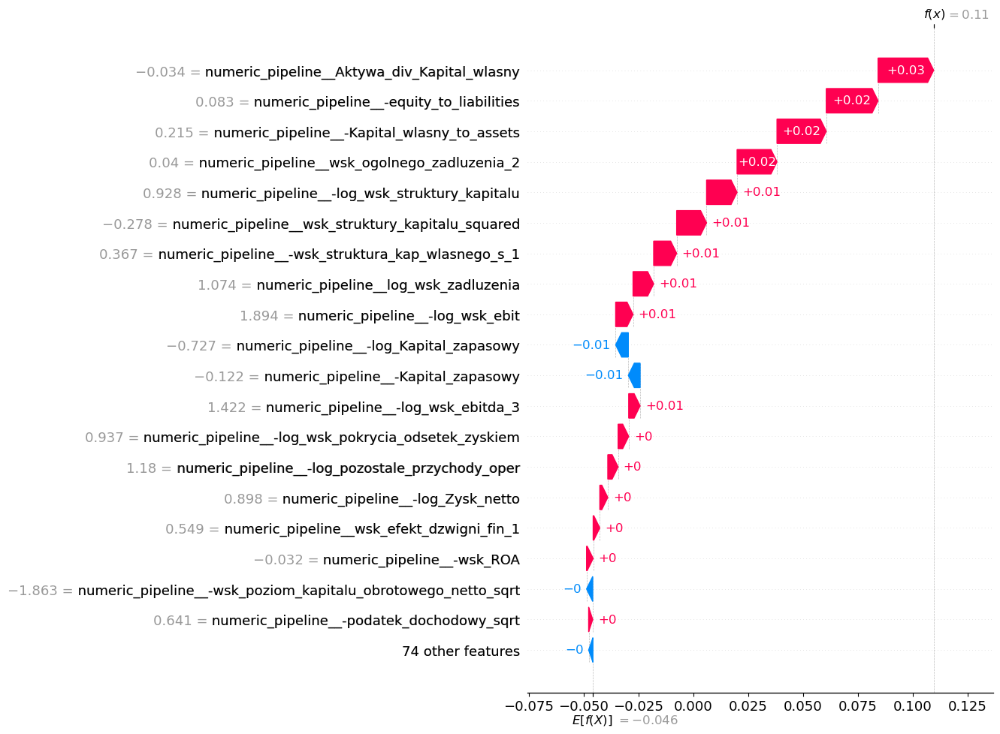

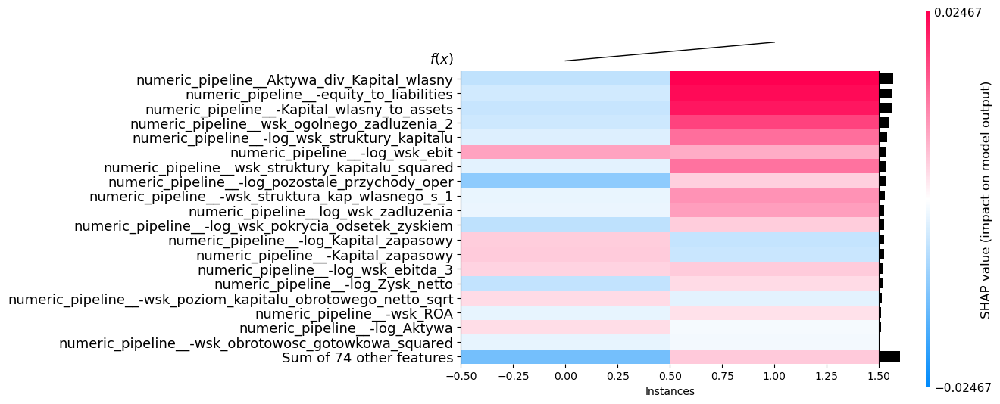

<Axes: xlabel='Instances'>

In [138]:
shap.plots.waterfall(shap_values_XGB[0], max_display=20)
shap.plots.waterfall(shap_values_XGB[1], max_display=20)

shap.plots.heatmap(shap_values_XGB[[0, 1]], max_display=20)

#### Max i Min PD

PD klienta o najwyższym ryzyku defaultu: 0.535

PD klienta o najniższym ryzyku defaultu: 0.456



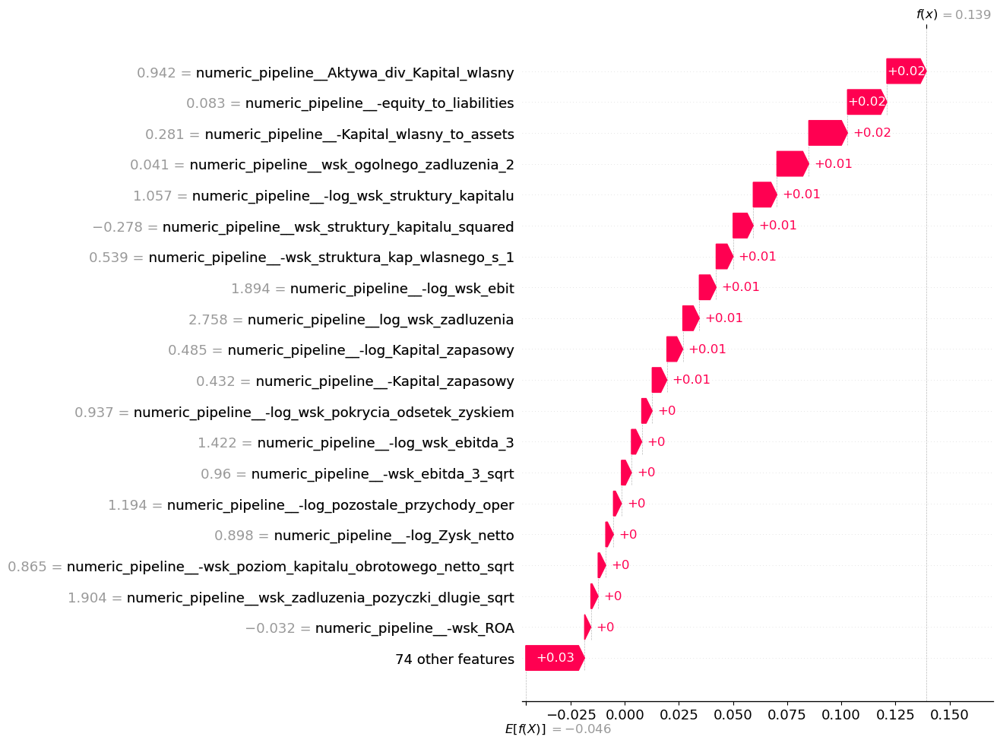

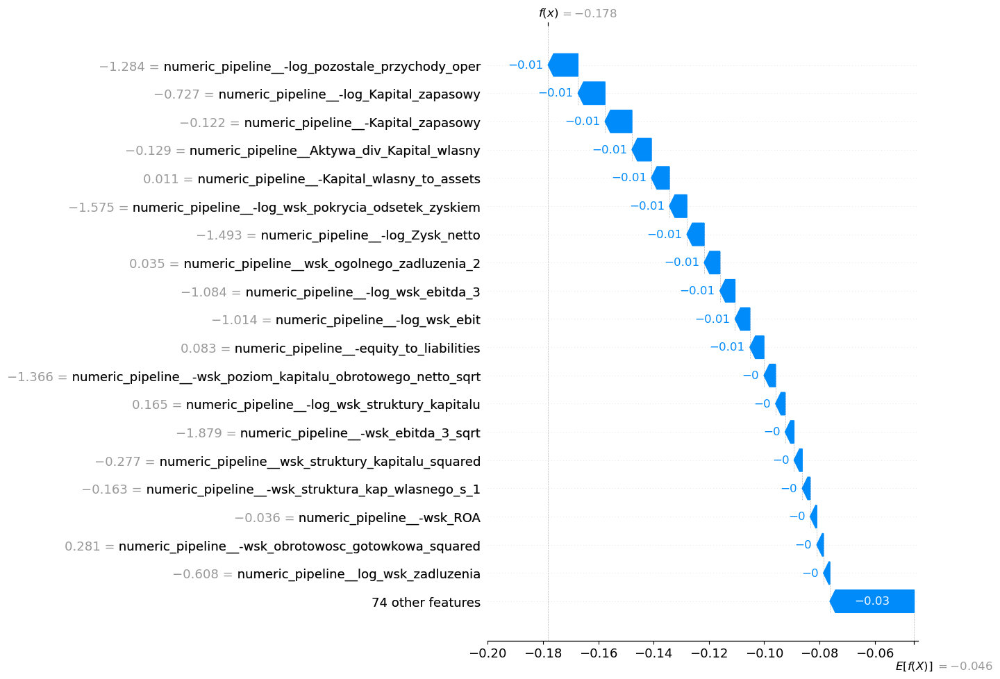

In [139]:
p_test_XGB = XGB.predict_proba(X_test)[:, 1]
idx_max2, idx_min2 = find_max_and_min_risk_obs(shap_values_XGB, p_test_XGB, X_test)
# Waterfall plot
shap.plots.waterfall(shap_values_XGB[idx_max2], max_display=20)
shap.plots.waterfall(shap_values_XGB[idx_min2], max_display=20)

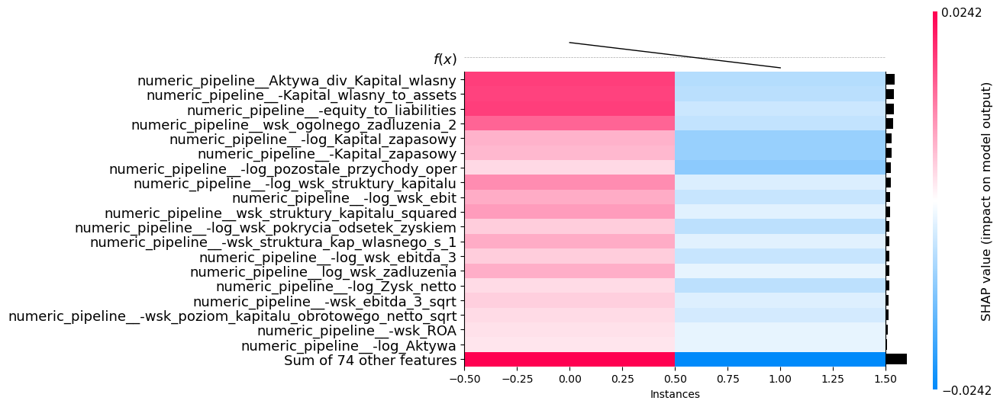

<Axes: xlabel='Instances'>

In [140]:
# Heatmapa dla 2 klientów (max PD i min PD)
shap.plots.heatmap(shap_values_XGB[[idx_max2, idx_min2]], max_display=20)

#### Przypadki graniczne


5 przypadków najbliżej granicy:
Indeks: 558, PD: 0.5000


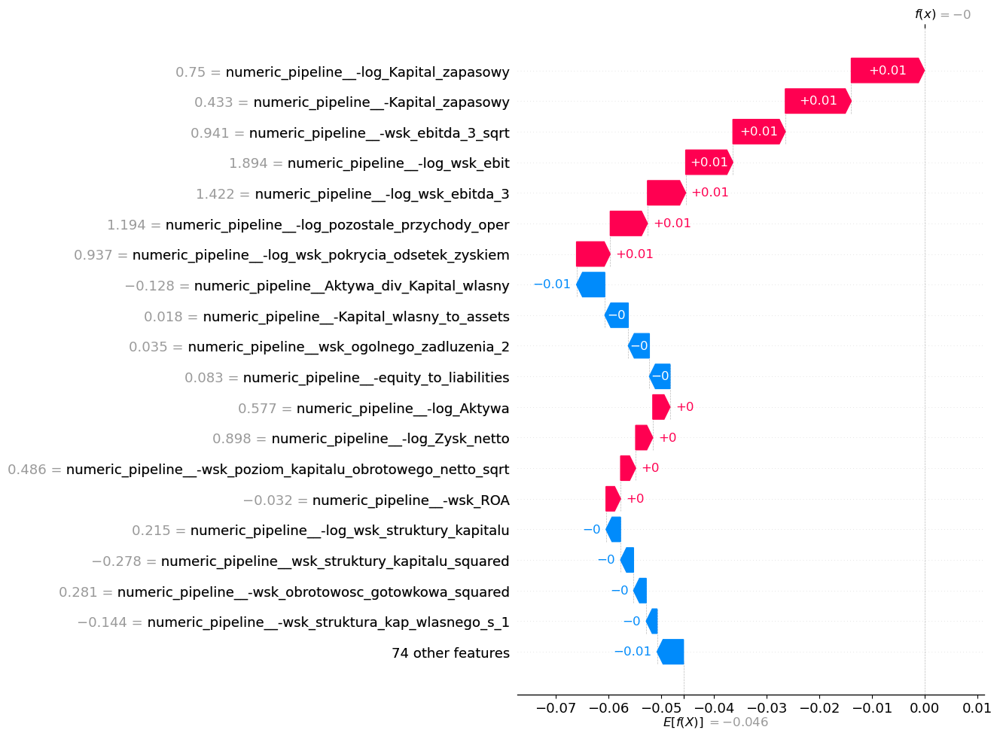

Indeks: 113, PD: 0.4999


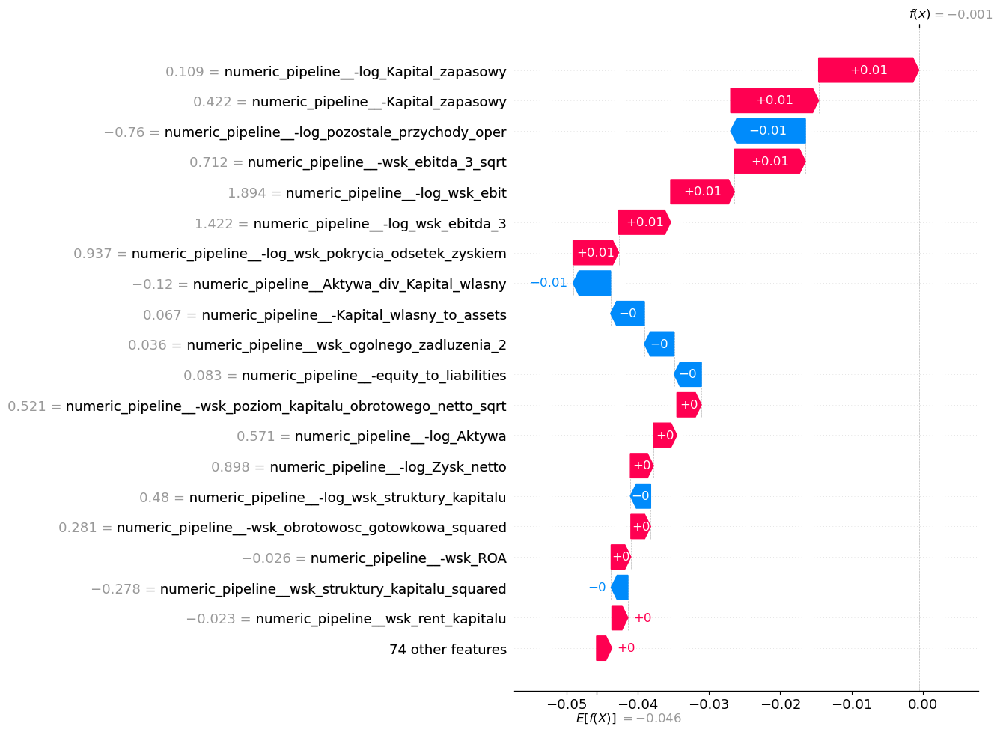

Indeks: 47, PD: 0.4998


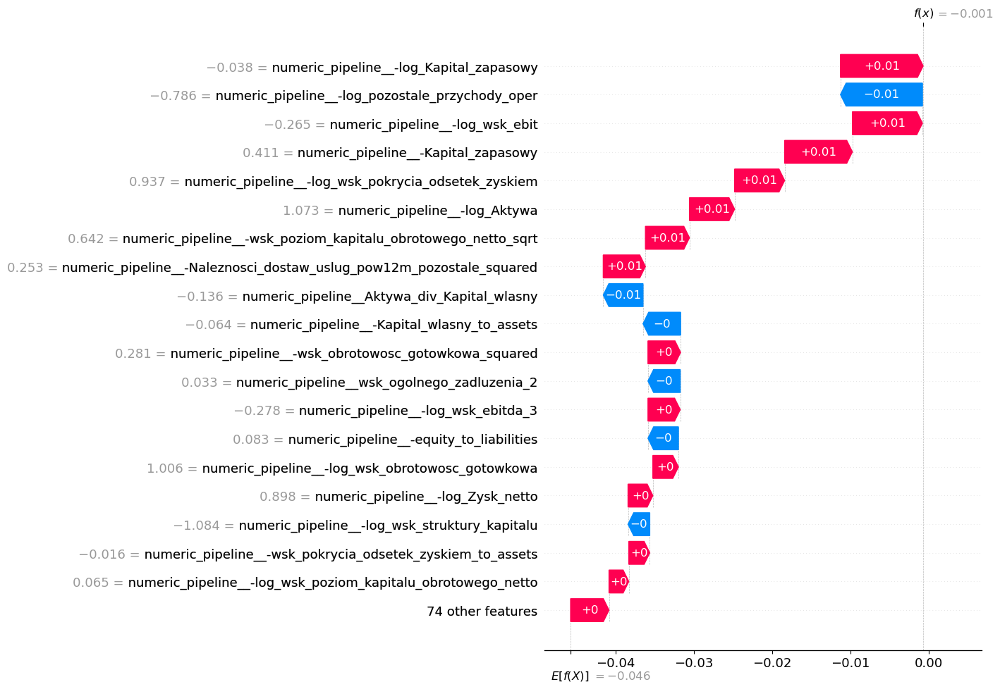

Indeks: 278, PD: 0.5002


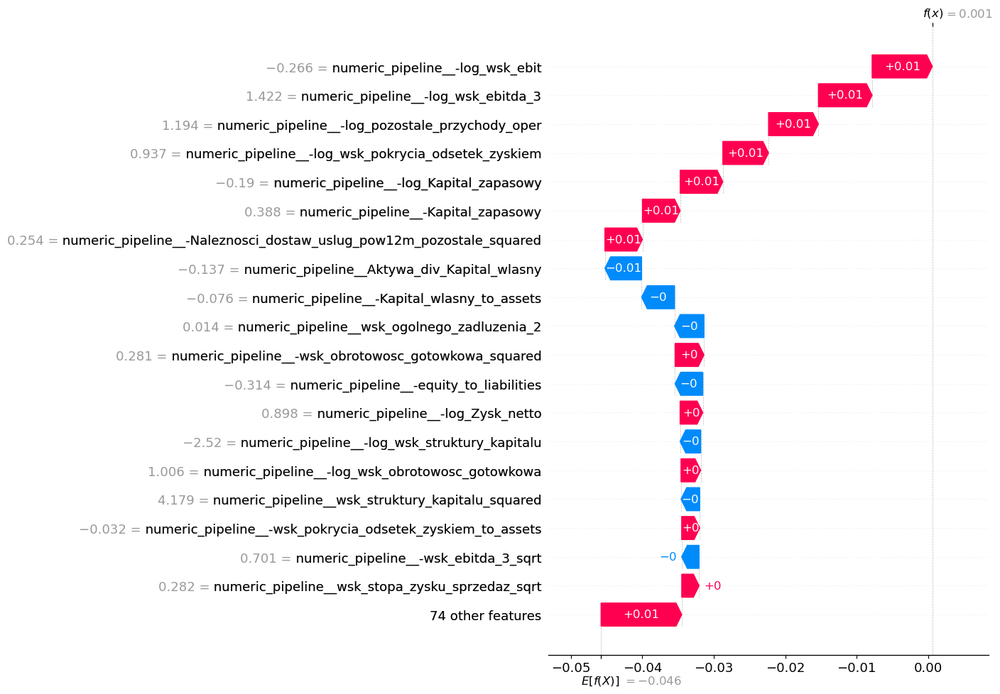

Indeks: 499, PD: 0.4998


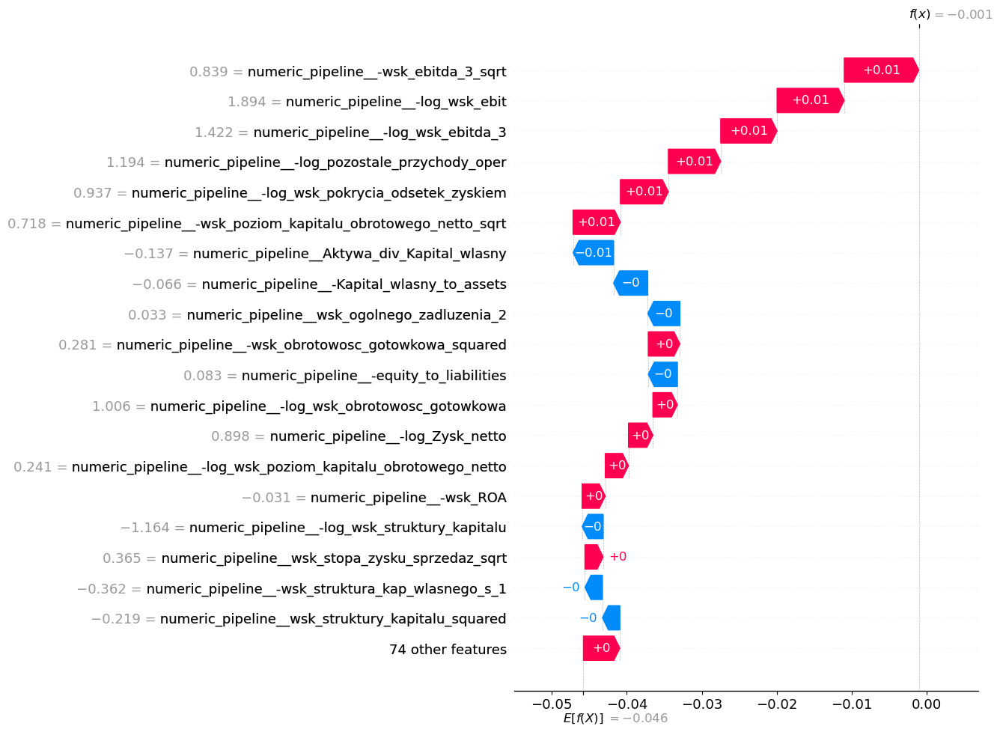

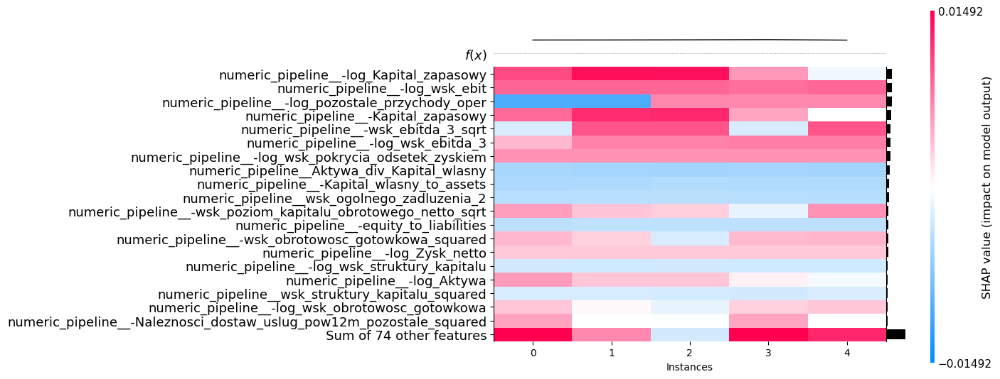

<Axes: xlabel='Instances'>

In [141]:
top_indices2, top_probas2 = get_top_n_borderline(p_test_XGB, n=5)

print("\n5 przypadków najbliżej granicy:")
for i, p in zip(top_indices2, top_probas2):
    print(f"Indeks: {i}, PD: {p:.4f}")
    shap.plots.waterfall(shap_values_XGB[i], max_display=20)

shap.plots.heatmap(shap_values_XGB[top_indices2], max_display=20)

### Wyjaśnienie LIME

>>> ANALIZA PRZYPADKU WYSOKIEGO RYZYKA (Max PD) <<<

Generowanie wyjaśnienia LIME dla indeksu: 277
Prawdopodobieństwo Defaultu (Klasa 1): 53.48%


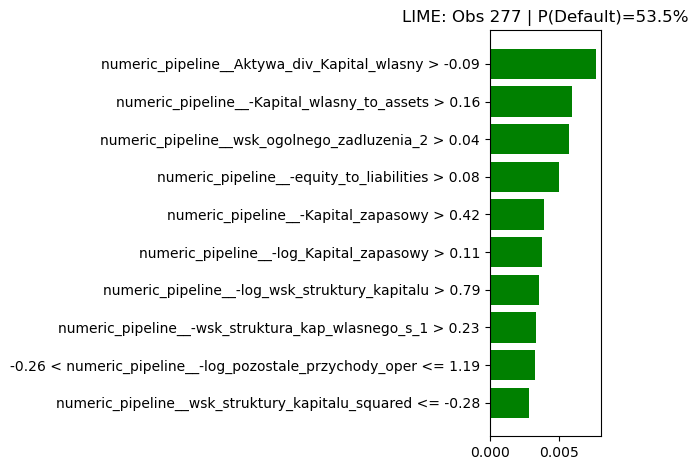

Kluczowe czynniki dla obserwacji 277:
 Kierunek  |    Waga    | Warunek (Reguła LIME)                   
----------------------------------------------------------------------
 RYZYKO ↑  | +0.0076     | numeric_pipeline__Aktywa_div_Kapital_wlasny > -0.09
 RYZYKO ↑  | +0.0059     | numeric_pipeline__-Kapital_wlasny_to_assets > 0.16
 RYZYKO ↑  | +0.0057     | numeric_pipeline__wsk_ogolnego_zadluzenia_2 > 0.04
 RYZYKO ↑  | +0.0050     | numeric_pipeline__-equity_to_liabilities > 0.08
 RYZYKO ↑  | +0.0039     | numeric_pipeline__-Kapital_zapasowy > 0.42
 RYZYKO ↑  | +0.0038     | numeric_pipeline__-log_Kapital_zapasowy > 0.11
 RYZYKO ↑  | +0.0035     | numeric_pipeline__-log_wsk_struktury_kapitalu > 0.79
 RYZYKO ↑  | +0.0033     | numeric_pipeline__-wsk_struktura_kap_wlasnego_s_1 > 0.23
 RYZYKO ↑  | +0.0032     | -0.26 < numeric_pipeline__-log_pozostale_przychody_oper <= 1.19
 RYZYKO ↑  | +0.0029     | numeric_pipeline__wsk_struktury_kapitalu_squared <= -0.28
------------------------------

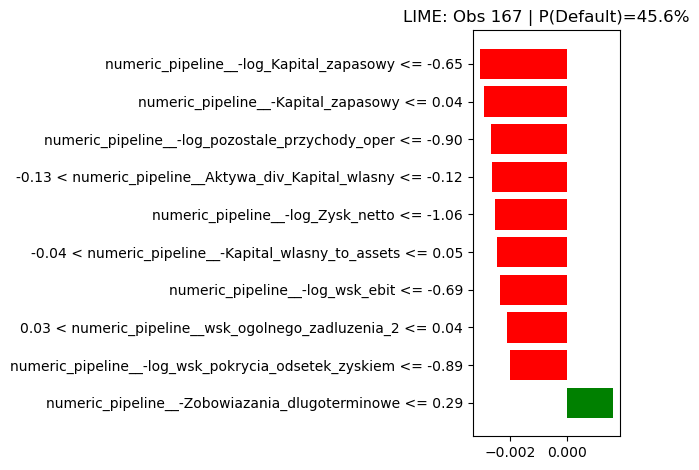

Kluczowe czynniki dla obserwacji 167:
 Kierunek  |    Waga    | Warunek (Reguła LIME)                   
----------------------------------------------------------------------
 RYZYKO ↓  | -0.0031     | numeric_pipeline__-log_Kapital_zapasowy <= -0.65
 RYZYKO ↓  | -0.0029     | numeric_pipeline__-Kapital_zapasowy <= 0.04
 RYZYKO ↓  | -0.0027     | numeric_pipeline__-log_pozostale_przychody_oper <= -0.90
 RYZYKO ↓  | -0.0026     | -0.13 < numeric_pipeline__Aktywa_div_Kapital_wlasny <= -0.12
 RYZYKO ↓  | -0.0025     | numeric_pipeline__-log_Zysk_netto <= -1.06
 RYZYKO ↓  | -0.0025     | -0.04 < numeric_pipeline__-Kapital_wlasny_to_assets <= 0.05
 RYZYKO ↓  | -0.0023     | numeric_pipeline__-log_wsk_ebit <= -0.69
 RYZYKO ↓  | -0.0021     | 0.03 < numeric_pipeline__wsk_ogolnego_zadluzenia_2 <= 0.04
 RYZYKO ↓  | -0.0020     | numeric_pipeline__-log_wsk_pokrycia_odsetek_zyskiem <= -0.89
 RYZYKO ↑  | +0.0016     | numeric_pipeline__-Zobowiazania_dlugoterminowe <= 0.29
------------------------

In [142]:
import lime
from lime import lime_tabular

lime_explainer = lime_tabular.LimeTabularExplainer(
    training_data=np.array(X_train),
    feature_names=X_train.columns.tolist(),
    class_names=['Non-Default', 'Default'],
    mode='classification',
    verbose=False,
    random_state=42
)

def explain_observation_lime(model, explainer, X_data, idx):
    """
    Generuje i wyświetla wyjaśnienie LIME dla konkretnej obserwacji.
    
    Args:
        model: Wytrenowany model (musi mieć metodę predict_proba)
        explainer: Obiekt lime_tabular.LimeTabularExplainer
        X_data: DataFrame z danymi testowymi/walidacyjnymi
        idx: Indeks obserwacji do wyjaśnienia
    """
    
    # Pobranie wiersza danych (obsługa iloc dla int i loc dla indeksów nazwanych)
    if isinstance(idx, int):
        instance = X_data.iloc[idx]
        instance_values = instance.values
    else:
        # Jeśli idx to np. ID klienta będące indeksem DataFrame
        instance = X_data.loc[idx]
        instance_values = instance.values

    # Predykcja dla nagłówka wykresu
    # Reshape jest potrzebny, bo model oczekuje tablicy 2D
    proba = model.predict_proba(instance_values.reshape(1, -1))[0]
    
    print(f"\nGenerowanie wyjaśnienia LIME dla indeksu: {idx}")
    print(f"Prawdopodobieństwo Defaultu (Klasa 1): {proba[1]:.2%}")

    # Generowanie wyjaśnienia
    # predict_fn to funkcja modelu zwracająca prawdopodobieństwa
    exp = explainer.explain_instance(
        data_row=instance_values,
        predict_fn=model.predict_proba,
        num_features=10,
        num_samples=5000  # Im więcej, tym stabilniejsze (ale wolniejsze)
    )
    
    # A. Wizualizacja (Wykres słupkowy LIME)
    fig = exp.as_pyplot_figure()
    plt.title(f'LIME: Obs {idx} | P(Default)={proba[1]:.1%}', fontsize=12)
    plt.tight_layout()
    plt.show()
    
    # B. Wypisanie listy reguł
    print(f"Kluczowe czynniki dla obserwacji {idx}:")
    print(f"{'Kierunek':^10} | {'Waga':^10} | {'Warunek (Reguła LIME)':<40}")
    print("-" * 70)
    
    for feature, weight in exp.as_list():
        # Interpretacja znaku wagi dla klasy 1 (Default)
        direction = "RYZYKO ↑" if weight > 0 else "RYZYKO ↓"
        print(f"{direction:^10} | {weight:+.4f}     | {feature}")
    print("-" * 70)


# 3. WYWOŁANIE DLA TWOICH PRZYPADKÓW
# Podmień 'xgb_model' na nazwę swojej zmiennej z modelem (np. pipeline, clf itp.)

print(">>> ANALIZA PRZYPADKU WYSOKIEGO RYZYKA (Max PD) <<<")
explain_observation_lime(XGB, lime_explainer, X_test, idx_max2)

print("\n\n>>> ANALIZA PRZYPADKU NISKIEGO RYZYKA (Min PD) <<<")
explain_observation_lime(XGB, lime_explainer, X_test, idx_min2)

## Stabilność

In [143]:
xgb_report = calculate_psi_csi(XGB, X_train, X_test, mode='model')


=== Raport Stabilności (Tryb: MODEL) ===


,Typ,Nazwa,PSI/CSI,Status
0,Model Score,Predykcja,0.0207,Stabilny


In [144]:
features_list_xgb = mean_shap_XGB.tail(5)['feature'].tolist()[::-1]

for col in features_list_xgb:
    print(f"--- Audyt dla cechy: {col} ---")
    if pd.api.types.is_numeric_dtype(X_test[col]) and X_test[col].nunique() > 10:
        try:
            segment_values = pd.qcut(X_test[col], q=4, labels=['Q1 (Niskie)', 'Q2', 'Q3', 'Q4 (Wysokie)'])
        except ValueError:
            segment_values = pd.cut(X_test[col], bins=4)
    else:
        segment_values = X_test[col]
    
    audit_results = subgroup_audit(LR, X_test, y_test, col, segment_values)
    
    if not audit_results.empty:
        display(audit_results)
    else:
        print("Zbyt małe podgrupy do analizy.")
    print("\n")

--- Audyt dla cechy: numeric_pipeline__Aktywa_div_Kapital_wlasny ---


,Segment,Liczebność,AUC,Brier,Średnie PD,Rzeczywisty DR,Różnica vs Global AUC
0,Q1 (Niskie),150,0.613991,0.240368,0.488152,0.146667,-0.131342
2,Q3,150,0.685415,0.177403,0.401213,0.073333,-0.059918
1,Q4 (Wysokie),150,0.712509,0.251908,0.531439,0.246667,-0.032825
3,Q2,150,0.858275,0.173625,0.408714,0.053333,0.112941




--- Audyt dla cechy: numeric_pipeline__-log_Kapital_zapasowy ---


,Segment,Liczebność,AUC,Brier,Średnie PD,Rzeczywisty DR,Różnica vs Global AUC
0,Q3,150,0.629630,0.245013,0.494156,0.180000,-0.115704
3,Q4 (Wysokie),150,0.693591,0.267168,0.546455,0.213333,-0.051742
2,Q2,150,0.715328,0.195701,0.435928,0.086667,-0.030005
1,Q1 (Niskie),150,0.725694,0.135422,0.352980,0.040000,-0.019639




--- Audyt dla cechy: numeric_pipeline__-Kapital_wlasny_to_assets ---


,Segment,Liczebność,AUC,Brier,Średnie PD,Rzeczywisty DR,Różnica vs Global AUC
0,Q1 (Niskie),150,0.613991,0.240368,0.488152,0.146667,-0.131342
2,Q3,150,0.685415,0.177403,0.401213,0.073333,-0.059918
1,Q4 (Wysokie),150,0.712509,0.251908,0.531439,0.246667,-0.032825
3,Q2,150,0.858275,0.173625,0.408714,0.053333,0.112941




--- Audyt dla cechy: numeric_pipeline__-Kapital_zapasowy ---


,Segment,Liczebność,AUC,Brier,Średnie PD,Rzeczywisty DR,Różnica vs Global AUC
0,Q3,150,0.629630,0.245013,0.494156,0.180000,-0.115704
3,Q4 (Wysokie),150,0.693591,0.267168,0.546455,0.213333,-0.051742
2,Q2,150,0.715328,0.195701,0.435928,0.086667,-0.030005
1,Q1 (Niskie),150,0.725694,0.135422,0.352980,0.040000,-0.019639




--- Audyt dla cechy: numeric_pipeline__-log_pozostale_przychody_oper ---


,Segment,Liczebność,AUC,Brier,Średnie PD,Rzeczywisty DR,Różnica vs Global AUC
1,"(0.532, 1.194]",255,0.636021,0.256867,0.518912,0.192157,-0.109312
2,"(-1.458, -0.793]",181,0.797590,0.150539,0.373195,0.082873,0.052257
0,"(-0.793, -0.131]",132,0.800361,0.203635,0.448820,0.068182,0.055028
3,"(-0.131, 0.532]",32,0.866667,0.214601,0.478517,0.156250,0.121333


## Porównanie jakości i spójności wyjaśnień z modelem interpretowalnym

---------- Dla śrenich |SHAP| ----------
=== Porównanie Global Feature Importance ===
Liczba porównywanych cech: 93
Korelacja rankingowa Spearmana: 0.3250 (p-value: 1.4797e-03)
Wniosek: Modele patrzą na zupełnie inne cechy (NISKA ZGODNOŚĆ).


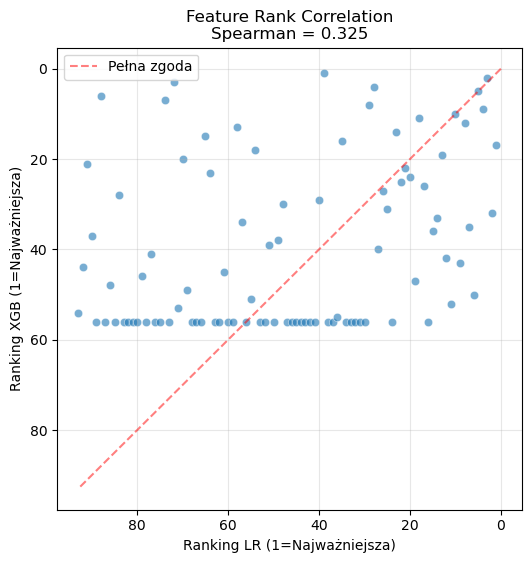

---------- Dla Permutation Importance ----------
=== Porównanie Global Feature Importance ===
Liczba porównywanych cech: 93
Korelacja rankingowa Spearmana: 0.3855 (p-value: 1.3568e-04)
Wniosek: Modele patrzą na zupełnie inne cechy (NISKA ZGODNOŚĆ).


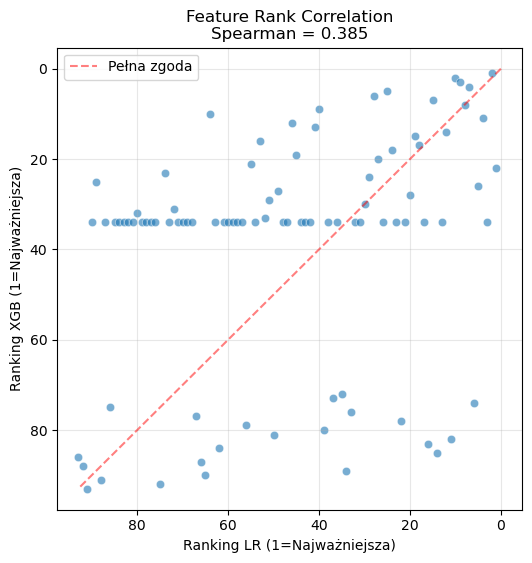

In [145]:
from scipy.stats import spearmanr
import seaborn as sns

def compare_global_importance(df_lr, df_xgb):
    """
    Porównuje ważność cech między dwoma modelami (LR i XGB).
    
    Parametry:
    - df_lr: DataFrame z kolumnami ['feature', 'importance']
    - df_xgb: DataFrame z kolumnami ['feature', 'importance']
    """
    
    # 1. Przygotowanie danych (zmiana nazw kolumn, aby uniknąć kolizji przy merge)
    # Wybieramy tylko potrzebne kolumny i zmieniamy nazwę 'importance'
    lr_prep = df_lr[['feature', 'importance']].rename(columns={'importance': 'lr_imp'})
    xgb_prep = df_xgb[['feature', 'importance']].rename(columns={'importance': 'xgb_imp'})
    
    # 2. Łączenie ramek po nazwie cechy (Inner Join)
    # Gwarantuje to, że porównujemy te same cechy.
    # Jeśli jakaś cecha jest w jednym modelu, a nie ma w drugim, zostanie pominięta.
    df_comp = pd.merge(lr_prep, xgb_prep, on='feature', how='inner')
    
    # 3. Obliczanie Rankingu (1 = najważniejsza cecha)
    # method='min' oznacza, że przy remisie cechy dostają ten sam, niższy numer rankingu
    df_comp['rank_lr'] = df_comp['lr_imp'].rank(ascending=False, method='min')
    df_comp['rank_xgb'] = df_comp['xgb_imp'].rank(ascending=False, method='min')
    
    # 4. Korelacja Spearmana (na rankingach)
    corr, p_value = spearmanr(df_comp['rank_lr'], df_comp['rank_xgb'])
    
    print(f"=== Porównanie Global Feature Importance ===")
    print(f"Liczba porównywanych cech: {len(df_comp)}")
    print(f"Korelacja rankingowa Spearmana: {corr:.4f} (p-value: {p_value:.4e})")
    
    if corr > 0.8:
        print("Wniosek: Modele są BARDZO ZGODNE co do hierarchii ważności cech.")
    elif corr > 0.5:
        print("Wniosek: Modele są UMIARKOWANIE ZGODNE.")
    else:
        print("Wniosek: Modele patrzą na zupełnie inne cechy (NISKA ZGODNOŚĆ).")

    # 5. Opcjonalna wizualizacja (Scatter plot rankingów)
    plt.figure(figsize=(6, 6))
    sns.scatterplot(data=df_comp, x='rank_lr', y='rank_xgb', alpha=0.6)
    
    # Linia idealnej zgody
    max_rank = max(df_comp['rank_lr'].max(), df_comp['rank_xgb'].max())
    plt.plot([0, max_rank], [0, max_rank], 'r--', alpha=0.5, label='Pełna zgoda')
    
    # Odwracamy osie, żeby 1 (Top) było w rogu (opcjonalne, ale intuicyjne dla rankingów)
    plt.gca().invert_xaxis()
    plt.gca().invert_yaxis()
    
    plt.title(f'Feature Rank Correlation\nSpearman = {corr:.3f}')
    plt.xlabel('Ranking LR (1=Najważniejsza)')
    plt.ylabel('Ranking XGB (1=Najważniejsza)')
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.show()

    return 

print("---------- Dla śrenich |SHAP| ----------")
compare_global_importance(mean_shap_LR, mean_shap_XGB)
print("---------- Dla Permutation Importance ----------")
compare_global_importance(perm_imp_LR, perm_imp_XGB)

#### Obserwacja:
Widzimy, że prawdopodobnie XGBoost kładzie nacisk na inne cechy niż Regresja Logistyczna i być może znalazł nieliniowe wzorce lub interakcje, których prostszy model nie wyłapał. Gdyby korelacja była wyższa, oznaczałoby to, że XGB tak naprawdę nie nauczył się niczego nietrywialnego, więc użycie bardziej skomplikowanego modelu byłoby zbędne. Wynik dla PI może być niższy niż dla SHAP jeśli do modelu weszły jakieś skorelowane cechy (LR podzielił wagę pomiędzy nie, stąd obie mają średnią ważność, a XGB wybierał jedną z nich do podziału w drzewie, stąd jedna będzie miała wyższą ważność niż 2 --> w takiej sytuacji korelacja rankingowa spada).

In [146]:
from numpy.linalg import norm

def compare_shap_local_consistency(shap_lr, shap_xgb):
    """
    Oblicza podobieństwo cosinusowe wektorów SHAP dla każdego rekordu.
    
    shap_lr: tablica (N_samples, N_features)
    shap_xgb: tablica (N_samples, N_features) lub (N_samples, N_features, 2)
    """
    
    # 1. Obsługa wymiarów dla XGB (jeśli jest 3D z Drzewa)
    # Jeśli shap_xgb ma 3 wymiary (N, M, 2), bierzemy klasę 1 (indeks 1)
    if len(shap_xgb.shape) == 3:
        # Upewnij się, że shap_lr też jest 2D
        shap_vec_xgb = shap_xgb[:, :, 1]
    else:
        shap_vec_xgb = shap_xgb
        
    shap_vec_lr = shap_lr
    
    # Weryfikacja kształtów
    if shap_vec_lr.shape != shap_vec_xgb.shape:
        print(f"BŁĄD: Niezgodne wymiary! LR: {shap_vec_lr.shape}, XGB: {shap_vec_xgb.shape}")
        return

    # 2. Obliczanie Cosine Similarity wiersz po wierszu
    # Wzór: (A . B) / (||A|| * ||B||)
    
    dot_products = np.sum(shap_vec_lr * shap_vec_xgb, axis=1)
    norms_lr = norm(shap_vec_lr, axis=1)
    norms_xgb = norm(shap_vec_xgb, axis=1)
    
    # Zabezpieczenie przed dzieleniem przez zero (dla bardzo małych wartości SHAP)
    epsilon = 1e-10
    cosine_similarities = dot_products / ((norms_lr * norms_xgb) + epsilon)
    
    # 3. Statystyki i Wizualizacja
    mean_sim = np.mean(cosine_similarities)
    median_sim = np.median(cosine_similarities)
    
    print("=== Local SHAP Consistency (Cosine Similarity) ===")
    print(f"Średnie podobieństwo: {mean_sim:.4f}")
    print(f"Mediana podobieństwa: {median_sim:.4f}")
    
    plt.figure(figsize=(10, 6))
    plt.hist(cosine_similarities, bins=30, color='teal', edgecolor='black', alpha=0.7)
    plt.axvline(mean_sim, color='red', linestyle='dashed', linewidth=2, label=f'Mean: {mean_sim:.2f}')
    plt.xlabel('Cosine Similarity (1 = Zgoda, -1 = Sprzeczność)')
    plt.ylabel('Liczba klientów/obserwacji')
    plt.title('Rozkład spójności wyjaśnień (LR vs XGB)\n(Czy modele decydują tak samo dla konkretnych osób?)')
    plt.legend()
    plt.grid(axis='y', alpha=0.3)
    plt.show()
    
    return cosine_similarities

=== Local SHAP Consistency (Cosine Similarity) ===
Średnie podobieństwo: 0.4182
Mediana podobieństwa: 0.4176


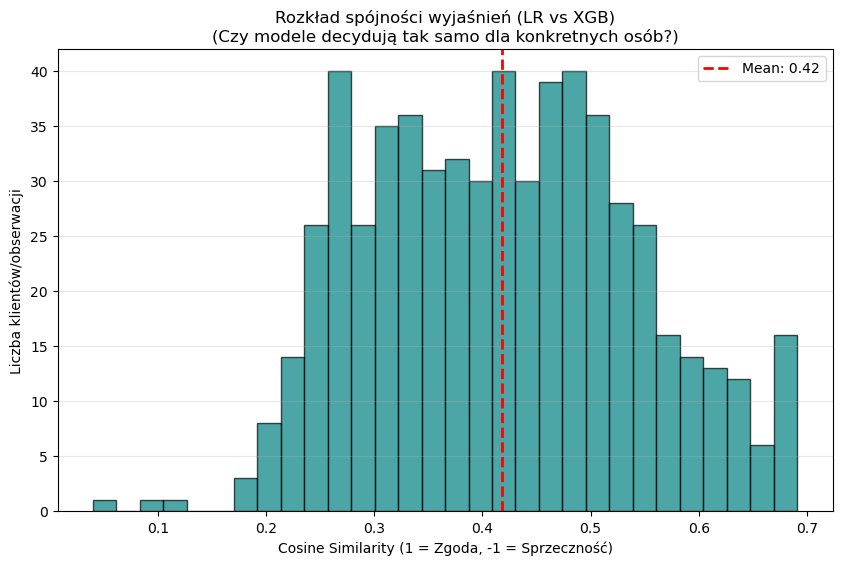

In [147]:
# Analiza Lokalnej Spójności (SHAP Correlation)
# Czy modele zgadzają się co do przyczyn decyzji dla poszczególnych klientów?
cosine_similarities = compare_shap_local_consistency(shap_vals_LR, shap_vals_XGB)

#### Obserwacja:
Modele niekoniecznie zgadzają się co do przyczyn decyzji dla poszczególnych klientów, wydaje się, że kierunek jest odpowiedni, ale patrzą na inne zależności.

### Porównanie PDP i ICE dla istotnych cech z obu modeli

In [148]:
def plot_pdp_comparison(model_lr, model_xgb, X_train, features_list):
    """
    Rysuje wykresy PDP parami: Lewa kolumna = LR, Prawa kolumna = XGB.
    Każdy wiersz odpowiada jednej cesze z listy.
    """
    n_features = len(features_list)
    
    # Ustawiamy rozmiar figury: stała szerokość, wysokość zależna od liczby cech
    fig, axes = plt.subplots(n_features, 2, figsize=(16, 4 * n_features))
    
    # Zabezpieczenie na wypadek tylko 1 cechy (matplotlib zwraca wtedy 1D array)
    if n_features == 1:
        axes = np.array([axes])

    for i, feature in enumerate(features_list):
        # --- KOLUMNA 1: Regresja Logistyczna ---
        PartialDependenceDisplay.from_estimator(
            model_lr,
            X_train,
            [feature],
            kind='average',
            ax=axes[i, 0],
            line_kw={'color': 'blue', 'linewidth': 2}
        )
        axes[i, 0].set_title(f"LR: {feature}", fontsize=12, fontweight='bold')
        axes[i, 0].grid(True, alpha=0.3)
        
        # --- KOLUMNA 2: XGBoost ---
        PartialDependenceDisplay.from_estimator(
            model_xgb,
            X_train,
            [feature],
            kind='average',
            ax=axes[i, 1],
            line_kw={'color': 'red', 'linewidth': 2}
        )
        axes[i, 1].set_title(f"XGB: {feature}", fontsize=12, fontweight='bold')
        axes[i, 1].grid(True, alpha=0.3)
        
        # Opcjonalnie: Ustawienie tej samej skali Y dla obu wykresów w wierszu, 
        # aby łatwiej porównać siłę efektu
        # y_min = min(axes[i, 0].get_ylim()[0], axes[i, 1].get_ylim()[0])
        # y_max = max(axes[i, 0].get_ylim()[1], axes[i, 1].get_ylim()[1])
        # axes[i, 0].set_ylim(y_min, y_max)
        # axes[i, 1].set_ylim(y_min, y_max)

    plt.tight_layout()
    plt.show()


Liczba unikalnych cech do analizy: 16
['numeric_pipeline__-Kapital_wlasny_to_assets'
 'numeric_pipeline__-Kapital_zapasowy'
 'numeric_pipeline__-equity_to_liabilities'
 'numeric_pipeline__-log_Kapital_zapasowy'
 'numeric_pipeline__-log_Naleznosci_dostaw_uslug_12m_powiazane'
 'numeric_pipeline__-log_Zysk_netto'
 'numeric_pipeline__-log_podatek_dochodowy'
 'numeric_pipeline__-log_pozostale_przychody_oper'
 'numeric_pipeline__-log_wsk_ebit' 'numeric_pipeline__-log_wsk_ebitda_3'
 'numeric_pipeline__-log_wsk_ebitda_koszty_odsetkowe_3'
 'numeric_pipeline__-log_wsk_pokrycia_odsetek_zyskiem'
 'numeric_pipeline__Aktywa_div_Kapital_wlasny'
 'numeric_pipeline__log_wsk_zadluzenia'
 'numeric_pipeline__wsk_efekt_dzwigni_fin_1'
 'numeric_pipeline__wsk_ogolnego_zadluzenia_2']


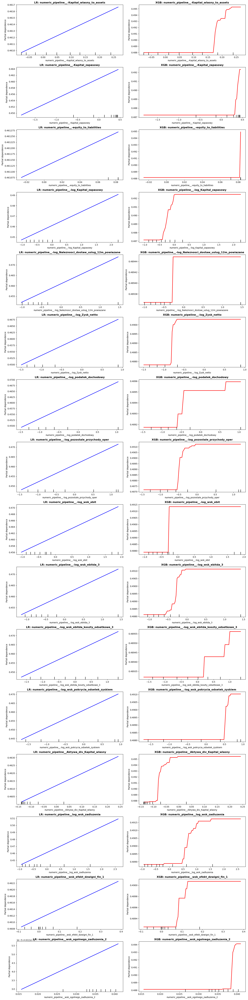

In [149]:
features_lr = mean_shap_LR.tail(10)['feature'].values
features_xgb = mean_shap_XGB.tail(10)['feature'].values

combined_features = np.unique(np.concatenate((features_lr, features_xgb)))

print(f"Liczba unikalnych cech do analizy: {len(combined_features)}")
print(combined_features)

plot_pdp_comparison(LR, XGB, X_train, combined_features)

e:\Programy\Anaconda\envs\interpretability\Lib\site-packages\sklearn\inspection\_plot\partial_dependence.py:995: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  ax.set_ylim([min_val, max_val])


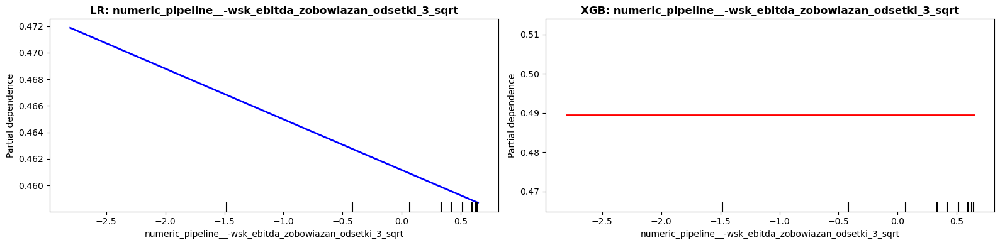

In [150]:
# Cecha z ujemną β i największym abs(β) w modelu regresji
plot_pdp_comparison(LR, XGB, X_train, ['numeric_pipeline__-wsk_ebitda_zobowiazan_odsetki_3_sqrt'])

#### Interpretacja PDP:
- Wzrost wartości na osi Y oznacza wzrost ryzyka kredytowego.
- Oś X reprezentuje wartość zmiennej wchodzącej do modelu (już po transformacji, czyli np. zlogarytmowaną i z minusem).
- Dla większości cech przesuwanie się w prawo na wykresie (wzrost wartości cechy) oznacza wzrost ryzyka. Ma to związek ze sposobem preprocessingu danych (odwrócenie znaku dla stymulant/cech pozytywnych dla ujednolicenia kierunku wpływów).

#### Obserwacja:
Widzimy ogólne podobieństwa trendów oraz to, że XGBoost znalazł nieliniowe zależności i korzysta z nich przy podziałach w drzewie, stąd być może wzrost istotności cech, które nie były w grupie tych najistotniejszych w modelu regresji. Kształt wykresów sugeruje występowanie efektów progowych i punktów zwrotnych. Schodki w XGBoost mogą pokazywać realne progi bezpieczeństwa, po przekroczeniu których sytuacja firmy drastycznie się pogarsza.

### Interpretacja ekonomiczna wpływu cech w modelach:
Przyjrzyjmy się bliżej najważniejszym cechom z obu modeli i oceńmy zgodność wpływów z wiedzą ekonomiczną:

1. Siła Finansowa i Bufor Bezpieczeństwa (Cechy z minusem) --> Te cechy działają jak tarcza. Ich brak (wzrost wartości ujemnej w stronę zera) zwiększa ryzyko.
- **'numeric_pipeline__-Kapital_wlasny_to_assets'** (Udział kapitału własnego w aktywach):
    - Ekonomia: To wskaźnik wypłacalności. Mówi, ile majątku sfinansowali właściciele.
    - Ryzyko: Spadek tego wskaźnika (czyli wzrost cechy w modelu) oznacza, że firma ma coraz cieńszą poduszkę finansową i jest bardziej lewarowana.
- **'numeric_pipeline__-equity_to_liabilities'** (Kapitał własny / Zobowiązania):
    - Ryzyko: Podobnie jak wyżej. Im mniejszy kapitał w stosunku do długów, tym mniejsza zdolność do absorpcji strat.
- **'numeric_pipeline__-Kapital_zapasowy'** oraz **'numeric_pipeline__-log_Kapital_zapasowy'**:
    - Ekonomia: Kapitał zapasowy to "skórniaki" firmy na czarną godzinę.
    - Ryzyko: Brak lub niski poziom kapitału zapasowego oznacza, że firma nie ma z czego pokryć ewentualnych strat.
-  **'numeric_pipeline__-wsk_struktura_kap_wlasnego_s_1'**:
    - Ekonomia: Prawdopodobnie udział kapitału podstawowego lub zapasowego w kapitale własnym ogółem. Stabilniejsza struktura (więcej trwałego kapitału) jest lepsza.
- **'numeric_pipeline__-log_Naleznosci_dostaw_uslug_12m_powiazane'** (Należności z tytułu dostaw i usług do 12 miesięcy od jednostek powiązanych):
    - Ekonomia: Wysokie należności od "jednostek powiązanych" oznaczają, że firma nie działa w próżni – jest częścią większej grupy kapitałowej lub holdingu.
    - Ryzyko: Niskie należności mogą oznaczać większe ryzyko.
---
2. Wielkość Firmy (Cechy z minusem).
- **'numeric_pipeline__-log_Aktywa'**:
    - Ekonomia: Rozmiar firmy (Suma Bilansowa). Logarytm spłaszcza duże wartości.
    - Ryzyko: Mniejsze firmy statystycznie częściej bankrutują niż duzi gracze (efekt skali, dywersyfikacja). Spadek aktywów = Wzrost ryzyka.
---
3. Rentowność i Efektywność (Cechy z minusem).
- **'numeric_pipeline__-log_Zysk_netto'**:
    - Ryzyko: Spadek zysku (lub strata) to bezpośrednia droga do problemów z płynnością.
- **'numeric_pipeline__-log_wsk_ebit'** (Rentowność operacyjna):
    - Ryzyko: Niska marża operacyjna oznacza, że podstawowy biznes firmy słabo zarabia.
- **'numeric_pipeline__-log_wsk_ebitda_3'**:
    - Ryzyko: Spadek EBITDA (gotówki operacyjnej) oznacza mniejszą zdolność do spłaty odsetek i inwestycji.
- **'numeric_pipeline__-log_podatek_dochodowy'**:
    - Ekonomia: Podatek płaci się od zysku.
    - Ryzyko: Mały (lub zerowy) podatek zazwyczaj oznacza mały zysk lub stratę podatkową. To proxy dla kondycji firmy.
- **'numeric_pipeline__-log_pozostale_przychody_oper'** (Pozostałe przychody operacyjne):
    - Ekonomia: Dotyczy to dodatkowych źródeł finansowania (np. dotacji unijnych, odszkodowań).
---
4. Płynność i Pokrycie (Cechy z minusem).
- **'numeric_pipeline__-log_wsk_ebitda_koszty_odsetkowe_3'** (Pokrycie odsetek):
    - Ekonomia: Ile razy zysk (EBITDA) pokrywa ratę odsetkową.
    - Ryzyko: Spadek tego wskaźnika jest krytyczny. Jeśli spada w okolice 1.0, firma pracuje tylko na bank. Poniżej 1.0 nie ma z czego płacić odsetek.
- **'numeric_pipeline__-wsk_poziom_kapitalu_obrotowego_netto_sqrt'**:
    - Ekonomia: Kapitał obrotowy netto to nadwyżka aktywów bieżących nad zobowiązaniami bieżącymi.
    - Ryzyko: Ujemny lub niski kapitał obrotowy oznacza problemy z płynnością dnia codziennego.
---
5. Zadłużenie i Dźwignia (Cechy BEZ minusa - Pozytywne) --> Te cechy to "ciężary". Ich wzrost bezpośrednio zwiększa ryzyko.
- **'numeric_pipeline__Aktywa_div_Kapital_wlasny'** (Mnożnik kapitału własnego):
    - Ekonomia: To odwrotność wskaźnika udziału kapitału. Mówi o tym, ile aktywów "utrzymuje" jedna złotówka właściciela.
    - Ryzyko: Wzrost tego wskaźnika to wzrost lewarowania. Im wyższy, tym firma bardziej zadłużona i ryzykowna.
- **'numeric_pipeline__log_wsk_zadluzenia'** oraz **'numeric_pipeline__wsk_ogolnego_zadluzenia_2'**:
    - Ryzyko: Klasyczny wskaźnik długu (Dług / Aktywa lub Dług / Kapitał). Im więcej długu, tym większe ryzyko niewypłacalności.
- **'numeric_pipeline__wsk_efekt_dzwigni_fin_1'** oraz **'numeric_pipeline__log_wsk_efekt_dzwigni_fin_1'**:
    - Ekonomia: Wskaźnik efektu dźwigni finansowej (często mierzony jako różnica ROE - ROA lub relacja długu).
    - Ryzyko: W modelach upadłościowych wysoka dźwignia (nawet jeśli w dobrych czasach podbija ROE) jest czynnikiem ryzyka, bo w złych czasach potęguje straty.
---

In [151]:
def plot_centered_ice_comparison(model_lr, model_xgb, X_train, features_list):
    """
    Rysuje wykresy Centered ICE 'side-by-side' dla podanych cech.
    Lewa kolumna = LR, Prawa kolumna = XGB.
    
    Args:
        model_lr: Wytrenowany model Regresji Logistycznej
        model_xgb: Wytrenowany model XGBoost
        X_train: Dane treningowe (DataFrame)
        features_list: Lista nazw cech do analizy
    """
    n_features = len(features_list)
    
    # Ustawiamy rozmiar: wysokość zależna od liczby cech
    fig, axes = plt.subplots(n_features, 2, figsize=(16, 5 * n_features))
    
    # Zabezpieczenie dla 1 cechy (żeby axes było zawsze 2D tablicą)
    if n_features == 1:
        axes = np.array([axes])

    for i, feature in enumerate(features_list):
        # --- KOLUMNA 1: Regresja Logistyczna ---
        # kind='both' rysuje ICE oraz PDP
        # centered=True centruje wykresy w pierwszym punkcie
        PartialDependenceDisplay.from_estimator(
            model_lr,
            X_train,
            [feature],
            kind='both',
            centered=True,
            ax=axes[i, 0],
            line_kw={'color': 'blue', 'alpha': 0.1}, # Linie ICE (przezroczyste)
            pd_line_kw={'color': 'black', 'linestyle': '--', 'linewidth': 3} # Linia PDP (przerywana, gruba)
        )
        axes[i, 0].set_title(f"LR (c-ICE): {feature}", fontsize=12, fontweight='bold')
        axes[i, 0].grid(True, alpha=0.3)
        
        # --- KOLUMNA 2: XGBoost ---
        PartialDependenceDisplay.from_estimator(
            model_xgb,
            X_train,
            [feature],
            kind='both',
            centered=True,
            ax=axes[i, 1],
            line_kw={'color': 'red', 'alpha': 0.1}, # Linie ICE (przezroczyste)
            pd_line_kw={'color': 'black', 'linestyle': '--', 'linewidth': 3} # Linia PDP (przerywana, gruba)
        )
        axes[i, 1].set_title(f"XGB (c-ICE): {feature}", fontsize=12, fontweight='bold')
        axes[i, 1].grid(True, alpha=0.3)
        
        # Ujednolicenie skali Y w wierszu dla łatwiejszego porównania
        # (Opcjonalne, ale zalecane przy ICE)
        y_min = min(axes[i, 0].get_ylim()[0], axes[i, 1].get_ylim()[0])
        y_max = max(axes[i, 0].get_ylim()[1], axes[i, 1].get_ylim()[1])
        axes[i, 0].set_ylim(y_min, y_max)
        axes[i, 1].set_ylim(y_min, y_max)

    plt.tight_layout()
    plt.show()

def plot_2d_pdp_comparison(model_lr, model_xgb, X_train, feature_pairs):
    """
    Rysuje wykresy 2D PDP (mapy konturowe) dla par cech.
    
    Args:
        feature_pairs: Lista krotek lub list par cech, np. [('Wiek', 'Dochod'), ('Zysk', 'Koszt')]
    """
    n_pairs = len(feature_pairs)
    
    # Rozmiar figury
    fig, axes = plt.subplots(n_pairs, 2, figsize=(16, 6 * n_pairs))
    
    if n_pairs == 1:
        axes = np.array([axes])

    for i, (feat1, feat2) in enumerate(feature_pairs):
        # Formatowanie pary cech dla sklearn (wymaga listy zawierającej krotkę)
        features_to_plot = [(feat1, feat2)]
        
        # --- KOLUMNA 1: Regresja Logistyczna ---
        PartialDependenceDisplay.from_estimator(
            model_lr,
            X_train,
            features_to_plot,
            ax=axes[i, 0],
            contour_kw={'cmap': 'Blues'} # Kolorystyka niebieska
        )
        axes[i, 0].set_title(f"LR: {feat1} vs {feat2}", fontsize=12, fontweight='bold')
        
        # --- KOLUMNA 2: XGBoost ---
        PartialDependenceDisplay.from_estimator(
            model_xgb,
            X_train,
            features_to_plot,
            ax=axes[i, 1],
            contour_kw={'cmap': 'Reds'} # Kolorystyka czerwona
        )
        axes[i, 1].set_title(f"XGB: {feat1} vs {feat2}", fontsize=12, fontweight='bold')

    plt.tight_layout()
    plt.show()

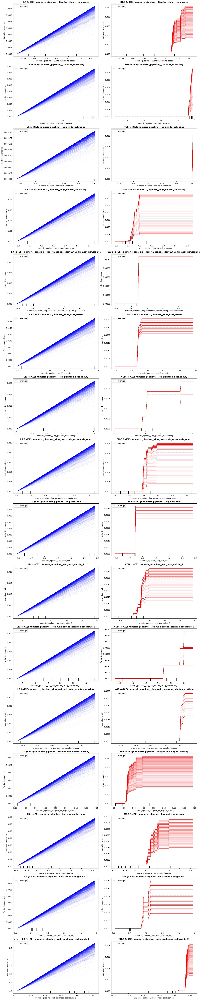

In [152]:
plot_centered_ice_comparison(LR, XGB, X_train, combined_features)

#### Obserwacje:
- Widzimy, że ogólny kierunek wpływu jest zachowany, jednak w przypadku Regresji zależności są liniowe, zaś dla XGB krzywe mają kształt bardziej schodkowy, choć wygładzony (w przeciwieństwie do np. pojedynczego drzewa decyzyjnego), więc XGB wyłapał nieliniowe zależności, które mogą dać podstawy do głębszej i ciekawej analizy, np. w celu segmentacji klientów.
- Widzimy, że dla wielu cech XGB wykrył tzw. threshold effect - początkowo cecha nie ma wpływu, jednak od pewnego progu gwałtownie rośnie, co może być bazą do analizy tzw. turning points.
- Podobnie na niektórych krzywych dla XGB widzimy efekt plateau, czyli sytuację, że od pewnego momentu dalszy wzrost cechy nie ma już znaczenia (np. dla cechy '-log_Kapital_zapasowy').

['numeric_pipeline__-Kapital_wlasny_to_assets'
 'numeric_pipeline__-log_Kapital_zapasowy'
 'numeric_pipeline__-log_pozostale_przychody_oper'
 'numeric_pipeline__-log_wsk_pokrycia_odsetek_zyskiem'
 'numeric_pipeline__Aktywa_div_Kapital_wlasny'
 'numeric_pipeline__log_wsk_zadluzenia'
 'numeric_pipeline__wsk_efekt_dzwigni_fin_1']
Liczba wygenerowanych par: 21


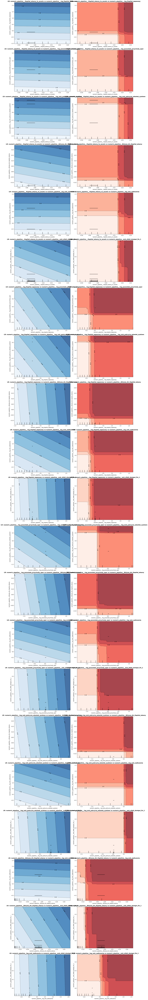

In [153]:
# Pary do sprawdzenia interakcji
features_lr = mean_shap_LR.tail(5)['feature'].values
features_xgb = mean_shap_XGB.tail(5)['feature'].values
combined_features = np.unique(np.concatenate((features_lr, features_xgb)))
combined_features = np.delete(combined_features, 1)
print(combined_features)
all_pairs = list(combinations(combined_features, 2))

print(f"Liczba wygenerowanych par: {len(all_pairs)}")
plot_2d_pdp_comparison(LR, XGB, X_train, all_pairs)

#### Obserwacje:
Po prawej stronie widzimy wykresy 2D Partial Dependence dla XGBoost a po lewej dla Logistic Regression. W każdym wierszu mamy porównanie tej samej interakcji dla dwóch modeli. Widzimy znaczne różnice między wykresami, więc modele wychwytują inne zależności. XGB prawdopodobnie zauważa interakcje, których nie uwzględnia model liniowy, stąd widoczne ciekawsze struktury i obszary wysokiego ryzyka.

## Wnioski z analiz:
#### 1. Najważniejsze cechy:
Istotnymi cechami dla rozważanego problemu są:
- **dla obu modeli:** 'numeric_pipeline__-log_Kapital_zapasowy', 'numeric_pipeline__log_wsk_zadluzenia', 'numeric_pipeline__-log_pozostale_przychody_oper', 'numeric_pipeline__-log_wsk_ebitda_3'
- **dla LR:** 'numeric_pipeline__wsk_efekt_dzwigni_fin_1', 'numeric_pipeline__log_wsk_efekt_dzwigni_fin_1', 'numeric_pipeline__-log_wsk_ebitda_koszty_odsetkowe_3',
'numeric_pipeline__-log_Naleznosci_dostaw_uslug_12m_powiazane', 'numeric_pipeline__-log_Zysk_netto', 'numeric_pipeline__-log_podatek_dochodowy', 'numeric_pipeline__-log_Aktywa',
- **dla XGB:** 'numeric_pipeline__Aktywa_div_Kapital_wlasny', 'numeric_pipeline__-Kapital_zapasowy', 'numeric_pipeline__-Kapital_wlasny_to_assets', 'numeric_pipeline__-equity_to_liabilities', 'numeric_pipeline__wsk_ogolnego_zadluzenia_2', 'numeric_pipeline__-log_wsk_ebit', 'numeric_pipeline__-wsk_struktura_kap_wlasnego_s_1', 'numeric_pipeline__-wsk_poziom_kapitalu_obrotowego_netto_sqrt'
- Przy dokładniejszej analizie cechy wykazują różne wpływy (np. obserwujemy efekt plateau lub threshold zamiast liniowej gładkiej zależności) oraz wchodzą w pewne interakcje tworząc grupy podwyższonego ryzyka.
#### 2. Różnice między modelami:
- W obrębie kilkunastu najważniejszych cech modele wykorzystują w dużej mierze inne cechy do predykcji, choć część kluczowych się pokrywa.
- Wykresy PDP i ICE dla poszczególnych modeli różnią się znacząco, co oznacza, że modele uczą się różnych zależności.
- Model Regresji Logistycznej z natury nauczył się liniowych zależności dla każdej zmiennej.
- XGBoost jako model drzewiasty wyłapał jednak inne związki, np. występowanie tzw. turning points, czy nieliniowych efektów. Takie spostrzeżenia mogą być pomocne dla lepszej segmentacji klientów pod kątem ryzyka.
#### 3. Interakcje:
- Dla regresji logistycznej linie ICE są raczej równoległe, co sugeruje brak interakcji. Model LR zakłada addytywność efektów.
- Dla XGBoost linie ICE są schodkowe i wygładzone oraz mają lekko różne nachylenia, co może oznaczać istnienie interakcji. Dla tego modelu wykresy 2D PDP pokazują nieco ciekawsze zależności niż dla Regresji Logistycznej. 
- Na podstawie tych interakcji można wyróżnić grupy niskiego i wysokiego ryzyka defaultu.
#### 4. Wnioski biznesowe:
1. Kluczowe czynniki wpływające na ryzyko to m.in. wskaźniki zadłużenia i ebitda, koszty odsetkowe, kapitał zapasowy, pozostałe przychody operacyjne, mnożnik kapitału własnego, udział kapitału własnego w aktywach, efekt dźwigni finansowej.
2. Dla wielu cech występują zależności nieliniowe i efekty progowe.
3. Interakcje między cechami: ryzyko default wzrasta w obecności kilku czynników jednocześnie, więc należy zwrócić uwagę na grupy podwyższonego ryzyka.